In [1]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from scipy import io
import anndata
import random
from matplotlib.ticker import MaxNLocator

random.seed(777)

import celloracle as co
co.__version__

# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 6]
plt.rcParams["savefig.dpi"] = 300

#GRN model construction and network analysis
#https://morris-lab.github.io/CellOracle.documentation/tutorials/networkanalysis.html


/opt/conda/envs/celloracle2/lib/python3.8/site-packages/logomaker/src/validate.py:98: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if matrix_type is 'information':
/opt/conda/envs/celloracle2/lib/python3.8/site-packages/logomaker/src/validate.py:104: SyntaxWarning: "is" with a literal. Did you mean "=="?
  elif matrix_type is 'probability':


In [2]:
#Set working directory
os.chdir("/storage1/fs1/jmillman/Active/DigitalTwin")

save_folder = "outputs/celloracle_figures"


# GRN model construction preprocessing

In [3]:
X = io.mmread('checkpoints/DT_Subset_EC_Beta_matrix.mtx')

adata= anndata.AnnData(X=X.transpose().tocsr())

metadata = pd.read_csv('checkpoints/DT_Subset_EC_Beta_metadata.csv')

with open ('checkpoints/DT_Subset_EC_Beta_gene_names.csv', 'r' ) as f:
    gene_names = f.read().splitlines()
    
adata.obs = metadata
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

pca = pd.read_csv('checkpoints/DT_Subset_EC_Beta_pca.csv')
pca.index = adata.obs.index

adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), 
                                  adata.obs['UMAP_2'].to_numpy())).T

... storing 'orig.ident' as categorical
... storing 'modality' as categorical
... storing 'dataset' as categorical
... storing 'protocol' as categorical
... storing 'stage' as categorical
... storing 'day' as categorical
... storing 'cellsource' as categorical
... storing 'gender' as categorical
... storing 'modality.1' as categorical
... storing 'dataset.1' as categorical
... storing 'protocol.1' as categorical
... storing 'stage.1' as categorical
... storing 'day.1' as categorical
... storing 'cellsource.1' as categorical
... storing 'gender.1' as categorical
... storing 'celltype_labelled_by_protocol' as categorical
... storing 'celltype_Beta_EC_subset' as categorical


eEP        2195
EC         2049
Beta       1343
lEP        1140
Beta-EC     195
Name: celltype_Beta_EC_subset, dtype: int64


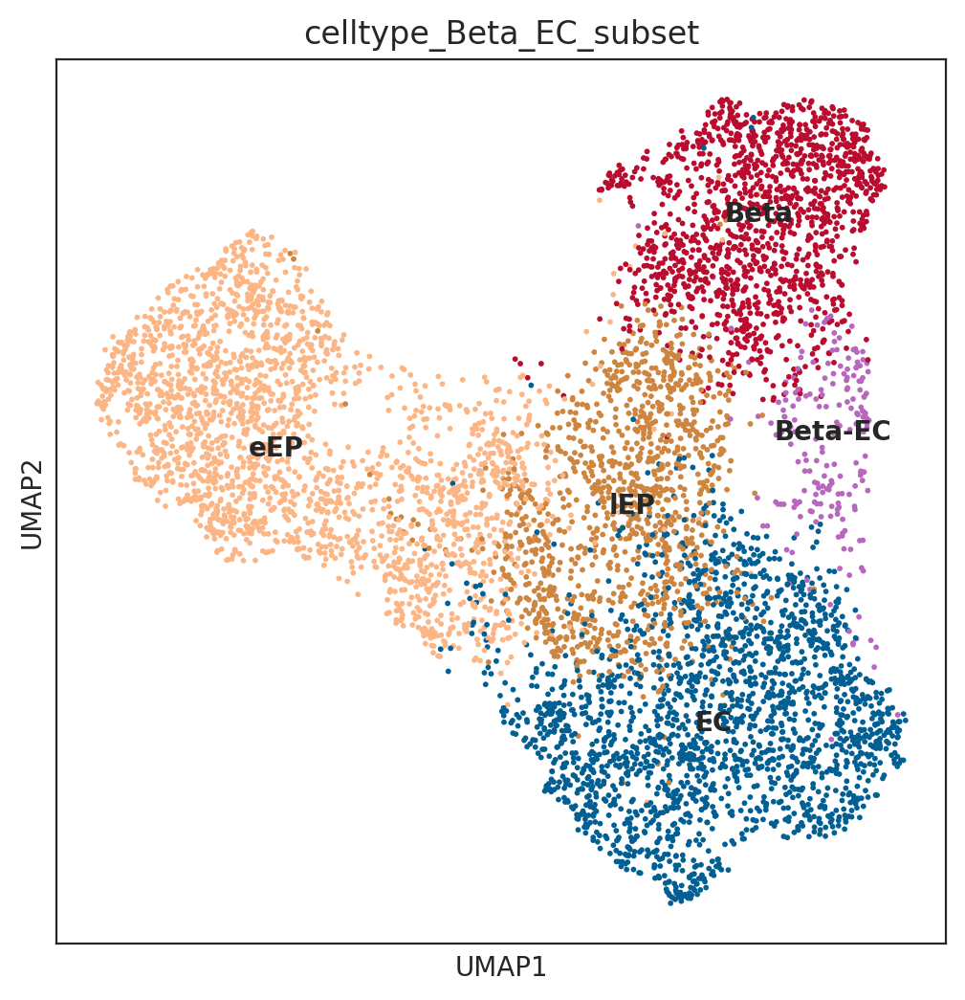

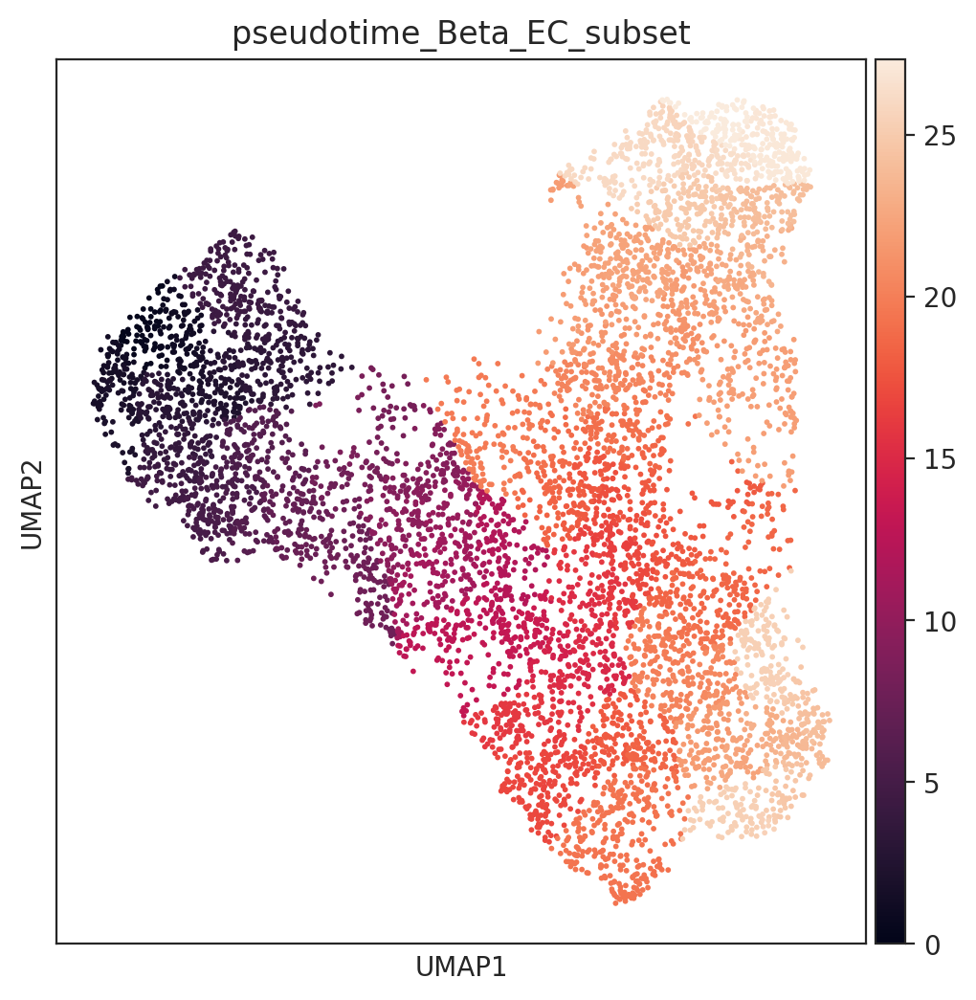

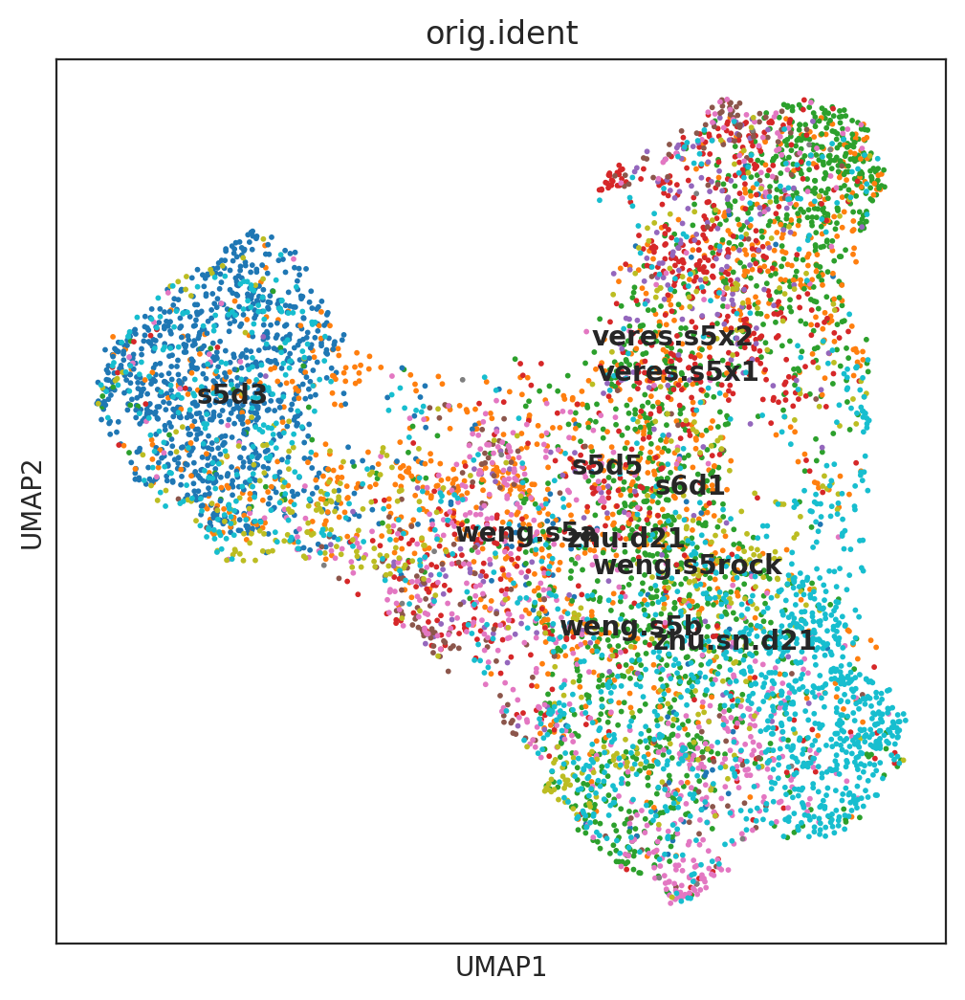

In [4]:
celltype_Beta_EC_subset_colors = ['#ba0c2f',"#b867bf" , "#015f94", "#fcb686","#cd853f"]
    
adata.uns["celltype_Beta_EC_subset_colors"] = celltype_Beta_EC_subset_colors

# Check how many cells are per cell type
cell_types = adata.obs['celltype_Beta_EC_subset']
cluster_counts = pd.value_counts(cell_types)
print(cluster_counts)

sc.pl.umap(adata, color='celltype_Beta_EC_subset', legend_loc='on data')
sc.pl.umap(adata, color='pseudotime_Beta_EC_subset', legend_loc='on data')
sc.pl.umap(adata, color='orig.ident', legend_loc='on data')

In [5]:
# Filter highly variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X, flavor='seurat', 
                                              n_top_genes=3000, log=False)

# Additional genes to include
# Including genes: from Differentiated human stem cells resemble fetal, not adult, β cells
additional_genes = ['ABCC8','ACOX2','ACSS3','AFP','AHR','ALDOA','ALX1',
                    'AR','ARX','ARHGEF12','ARID2','ARID5B','ARNT2','ARX',
                    'ASCL1','ASCL2','ATF2','ATF6', 'ATP5MC3','ATP6V0E1','BACH1',
                    'BACH2','BBX','BCL11A','BCLAF1','BDP1','BMP4',
                    'BPTF','CACNA1A','CACNA1B','CACNA1C','CACNA1E','CBX5',
                    'CCDC6','CDH1','CDH2','CDX2','CHD2','CHGB','CLOCK','CMIP',
                    'COL1A1','COX4I1','CREB1','CREB3L2','CREB5','CTCF',
                    'CTNNB1','CUX1','CUX2','DDC','DLL3',
                    'DPP4','E2F3','E2F7','EBF1','EBF3','ELF1','ELF2',
                    'ENO1','EPAS1','ESR1','ESR2','ESRRB','ESRRG','ETS1',
                    'ETS2','ETV1','ETV6','FEV','FFAR1',
                    'FOXA1','FOXA2','FOXA3','FOXC1','FOXJ3','FOXN2','FOXN3',
                    'FOXO1','FOXO3','FOXP1','FOXP2','GAST',
                    'GATA4','GATA6','GCG','GCH1','GCK','GHRL','GIP',
                    'GLI2','GLI3','GLIS3','GPI','GRHL2','GTF2I','HCN1','HCN2',
                    'HCN3','HCN4','HDAC2','HDX','HES1','HESX1','HHEX','HIF1A',
                    'HIVEP1','HIVEP2','HIVEP3','HLTF','HMGA2','HNF1A','HNF1B',
                    'HNF4A','HNF4G','IAPP','ID1',
                    'ID2','IKZF2','INS','INSM1','IRX1','IRX2','ISL1',
                    'ISX','JUN','KCNA3','KCNC2','KCNC4','KCNH2',
                    'KCNJ11','KCNJ2','KCNJ6','KCNK1','KCNK12','KCNK17',
                    'KCNMA1','KCNMB2','KCNN1','KLF12','KLF5','KLF7','LHX1',
                    'LHX4','LMO2','LMX1A','LMX1B','MAF','MAFB','MAOA',
                    'MAOB','MAP3K11','MECOM','MEF2A','MEF2C','MEIS1','MEIS2','MITF',
                    'MLXIPL','MMP2','MNX1','MXI1','MYCN','MYEF2','MYT1',
                    'NEUROD1','NEUROD4','NEUROG3','NF1','NFAT5','NFATC2','NFATC3',
                    'NFIA','NFIB','NFKB1','NKX2-2',
                    'NKX6-1','NNT','NPAS3','NR0B1','NR0B2',
                    'NR2C2','NR3C1','NR3C2','NR4A3','NR5A2','NR6A1','NRF1',
                    'ONECUT1','ONECUT2','ONECUT3','OSR1','OTX2',
                    'PAX4','PAX6','PBX1','PBX3','PCSK1','PDIA6','PDX1','PGAP1',
                    'PITX1','PITX2','PLAG1','PLAGL1','POU2F1',
                    'POU2F2','POU3F4','POU6F2','PPARG','PPY','PRDM16',
                    'PRDM5','PRKCSH','PRLR','PROX1','PTEN','PYY','RAD21',
                    'RAP1A','RBPJ','RFX1','RFX2','RFX3','RFX4','RFX6','RFX7','RIMS1',
                    'RIMS2','RIMS4','RORA','RORB','RREB1','RUNX1','RXRA','RXRB',
                    'RXRG','SCN2A','SCN3A','SCT','SHH','SIM1',
                    'SIX2','SLC18A1','SLC2A1','SLC2A14','SLC2A2','SLC2A3','SLC30A8',
                    'SLC6A4','SMAD2','SMAD3','SMARCA1','SMARCA5','SMARCC1','SMC3',
                    'SNAP25','SOX11','SOX2','SOX4','SOX6','SOX9',
                    'SREBF2','SRY','SSTR2','STAT1','STAT4','STX1A','STXBP1','SYP',
                    'SYT4','SYT7','TBX3','TCF12','TCF4','TCF7L1','TCF7L2',
                    'TEAD1','TFDP2','THRA','THRB','TP63','TPH1','UCN3',
                    'VAMP2','WNT4','WNT5A','XBP1','ZBTB16',
                    'ZBTB7C','ZEB1','ZFHX3','ZKSCAN1','ZNF148','ZNF423','ZNF431',
                    'ZNF652','ZNF708']
#Out:

# Get the indices of genes that passed the filtering
selected_indices = np.where(filter_result.gene_subset)[0]

# Add indices of additional genes
additional_gene_indices = [adata.var_names.get_loc(gene) for gene in additional_genes]

# Combine indices and make them unique
all_selected_indices = np.concatenate([selected_indices, additional_gene_indices])
all_selected_indices = np.unique(all_selected_indices)

# Subset the data using selected indices
adata = adata[:, all_selected_indices]

adata

View of AnnData object with n_obs × n_vars = 6922 × 3112
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ATAC', 'nFeature_ATAC', 'modality', 'dataset', 'protocol', 'stage', 'day', 'cellsource', 'gender', '_indices', '_scvi_batch', '_scvi_labels', 'modality.1', 'dataset.1', 'protocol.1', 'stage.1', 'day.1', 'cellsource.1', 'gender.1', '_indices.1', '_scvi_batch.1', '_scvi_labels.1', 'multivi_clusters', 'cell', 'celltype_labelled_by_protocol', 'RNA_snn_res.2', 'seurat_clusters', 'celltype_Beta_EC_subset', 'pseudotime_Beta_EC_subset', 'barcode', 'UMAP_1', 'UMAP_2'
    uns: 'celltype_Beta_EC_subset_colors', 'orig.ident_colors'
    obsm: 'X_pca', 'X_umap'

In [6]:
#Downsampling
#If your scRNA-seq data includes more than 20-30K cells, we recommend downsampling your data. 
#If you do not, please note the perturbation simulations may require large amounts of memory in the next notebook.

print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

# Random downsampling into 30K cells if the anndata object include more than 30 K cells.
n_cells_downsample = 30000 
if adata.shape[0] > n_cells_downsample:
    # Let's dowmsample into 30K cells
    sc.pp.subsample(adata, n_obs=n_cells_downsample, random_state=123)
    
print(f"Cell number is :{adata.shape[0]}")

Cell number is :6922
Gene number is :3112
Cell number is :6922


In [7]:
pseudotime_DT_Subset_EC_Beta = adata.obs['pseudotime_Beta_EC_subset']
pseudotime_DT_Subset_EC_Beta

cell_id = "s5d3_GAGTCAAAGTTCCTCA-1_paired"

cell_id in pseudotime_DT_Subset_EC_Beta.index


True

In [8]:
#Load base-GRN data
base_GRN = pd.read_parquet("checkpoints/DT_27944_peaks_base_GRN_df.parquet",
                           engine='pyarrow')

# Check data
print(base_GRN.head(1))


                     peak_id gene_short_name  9430076C15RIK  AC002126.6  \
0  chr10_100009426_100010396           DNMBP              0           0   

   AC012531.1  AC226150.2  AFP  AHR  AHRR  AIRE  ...  ZNF784  ZNF8  ZNF816  \
0           0           0    0    0     0     0  ...       0     0       0   

   ZNF85  ZSCAN10  ZSCAN16  ZSCAN22  ZSCAN26  ZSCAN31  ZSCAN4  
0      0        0        0        0        0        0       0  

[1 rows x 1096 columns]


In [9]:
# Instantiate Oracle object
oracle = co.Oracle()


In [10]:
# Check data in anndata
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

# The AnnData should have (1) gene expression counts, 
#(2) clustering information, and (3) trajectory (dimensional reduction embedding) data.


Metadata columns : ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ATAC', 'nFeature_ATAC', 'modality', 'dataset', 'protocol', 'stage', 'day', 'cellsource', 'gender', '_indices', '_scvi_batch', '_scvi_labels', 'modality.1', 'dataset.1', 'protocol.1', 'stage.1', 'day.1', 'cellsource.1', 'gender.1', '_indices.1', '_scvi_batch.1', '_scvi_labels.1', 'multivi_clusters', 'cell', 'celltype_labelled_by_protocol', 'RNA_snn_res.2', 'seurat_clusters', 'celltype_Beta_EC_subset', 'pseudotime_Beta_EC_subset', 'barcode', 'UMAP_1', 'UMAP_2']
Dimensional reduction:  ['X_pca', 'X_umap']


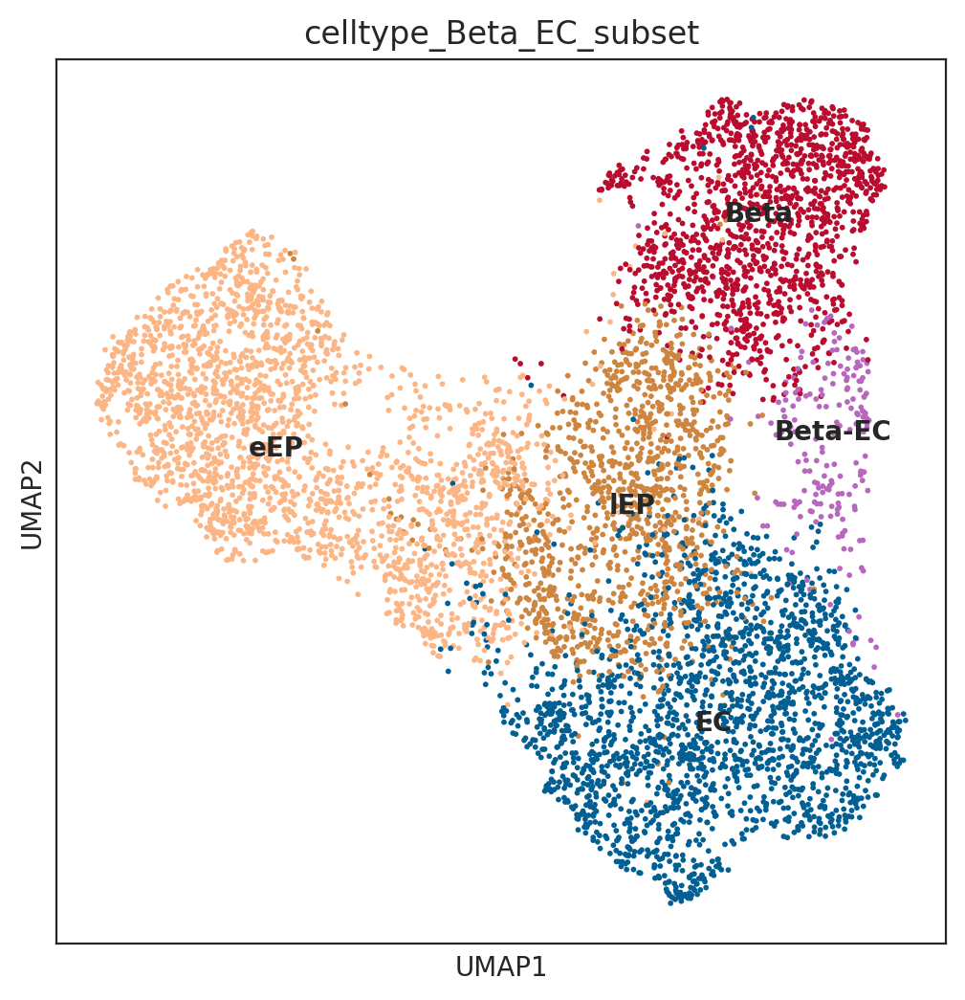

In [11]:
sc.pl.embedding(adata, basis='umap', color='celltype_Beta_EC_subset', legend_loc='on data')

adata.obs["celltype_Beta_EC_subset"] =adata.obs["celltype_Beta_EC_subset"].astype("category") 

In [12]:
adata.var

""
ADGRG4
TAFA5
UTY
USP9Y
TBL1Y
...
ATP2B1
NTS
MGAT4C
LRRIQ1


In [13]:
pseudotime_DT_Subset_EC_Beta = adata.obs['pseudotime_Beta_EC_subset']
pseudotime_DT_Subset_EC_Beta

barcode
s6d1_GGTAACTTCTCACTCA-1_paired              16.791452
s5d3_CCCAACCGTTCGCTCA-1_paired               3.215261
s5d5_CTTACTAGTCTCACTG-1_paired              22.312778
s5d5_AGGTACGCATAGACTT-1_paired               4.973724
s5d5_GCAATATGTGGGAACA-1_paired              24.765470
                                              ...    
zhu.sn.d21_TTTGACTCAAGAGCTG-1_expression    22.940783
zhu.sn.d21_TTTGATCCACAATGTC-1_expression    13.635298
zhu.sn.d21_TTTGGAGCATGAAGCG-1_expression    25.399232
zhu.sn.d21_TTTGGAGGTTACCGTA-1_expression    13.249179
zhu.sn.d21_TTTGTTGCACTTGAAC-1_expression    24.737759
Name: pseudotime_Beta_EC_subset, Length: 6922, dtype: float64

In [14]:
#Prepare for Pseudotime
sc.pp.neighbors(adata, n_neighbors=10, method='umap', use_rep='X_umap')  # Adjust parameters as needed

In [15]:
sc.tl.diffmap(adata, n_comps=10)

In [16]:
# Check data in anndata
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

# The AnnData should have (1) gene expression counts, 
#(2) clustering information, and (3) trajectory (dimensional reduction embedding) data.


Metadata columns : ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ATAC', 'nFeature_ATAC', 'modality', 'dataset', 'protocol', 'stage', 'day', 'cellsource', 'gender', '_indices', '_scvi_batch', '_scvi_labels', 'modality.1', 'dataset.1', 'protocol.1', 'stage.1', 'day.1', 'cellsource.1', 'gender.1', '_indices.1', '_scvi_batch.1', '_scvi_labels.1', 'multivi_clusters', 'cell', 'celltype_labelled_by_protocol', 'RNA_snn_res.2', 'seurat_clusters', 'celltype_Beta_EC_subset', 'pseudotime_Beta_EC_subset', 'barcode', 'UMAP_1', 'UMAP_2']
Dimensional reduction:  ['X_pca', 'X_umap', 'X_diffmap']


In [17]:
#adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="celltype_Beta_EC_subset",
                                   embedding_name="X_umap")


In [18]:
#Load base-GRN data into oracle object
#You can load TF info dataframe with the following code.
oracle.import_TF_data(TF_info_matrix=base_GRN)


In [19]:
#KNN imputation

# Perform PCA
oracle.perform_PCA()


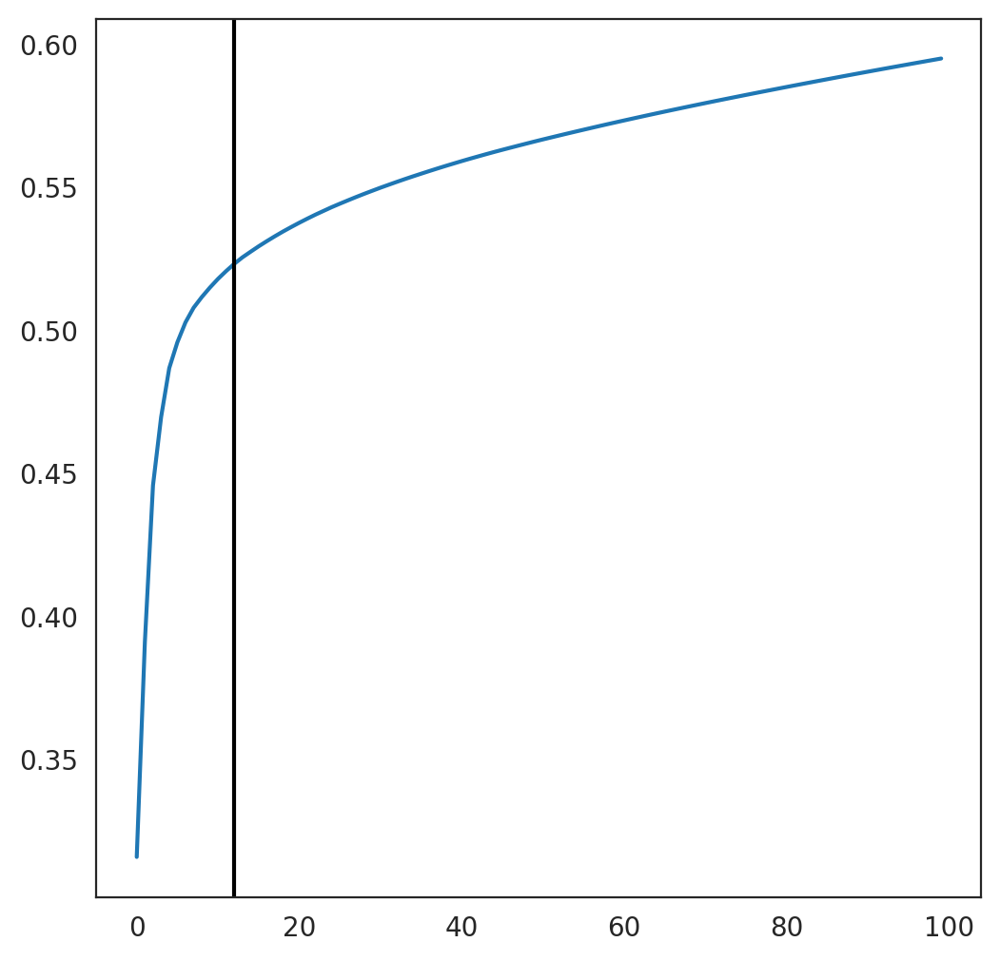

12


In [20]:
# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)


In [21]:
#Estimate the optimal number of nearest neighbors for KNN imputation.

n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

#KNN imputation
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)


cell number is :6922
Auto-selected k is :173


Clustering name:  celltype_Beta_EC_subset
Cluster list ['Beta', 'Beta-EC', 'EC', 'eEP', 'lEP']


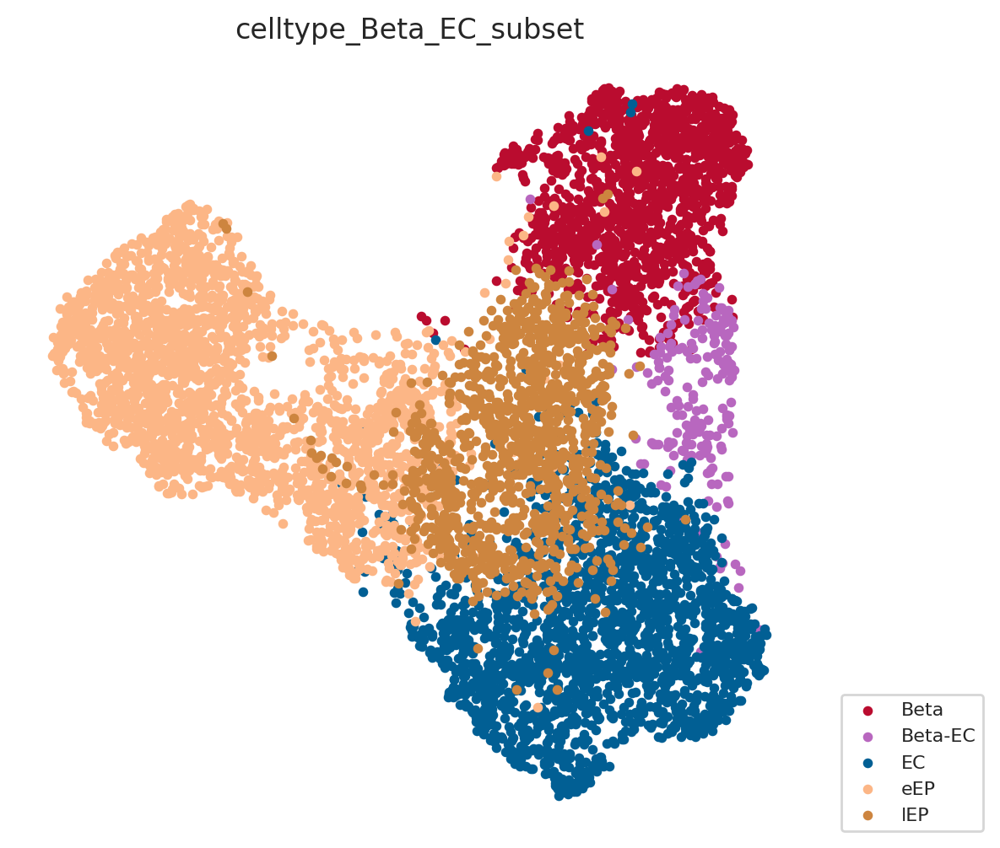

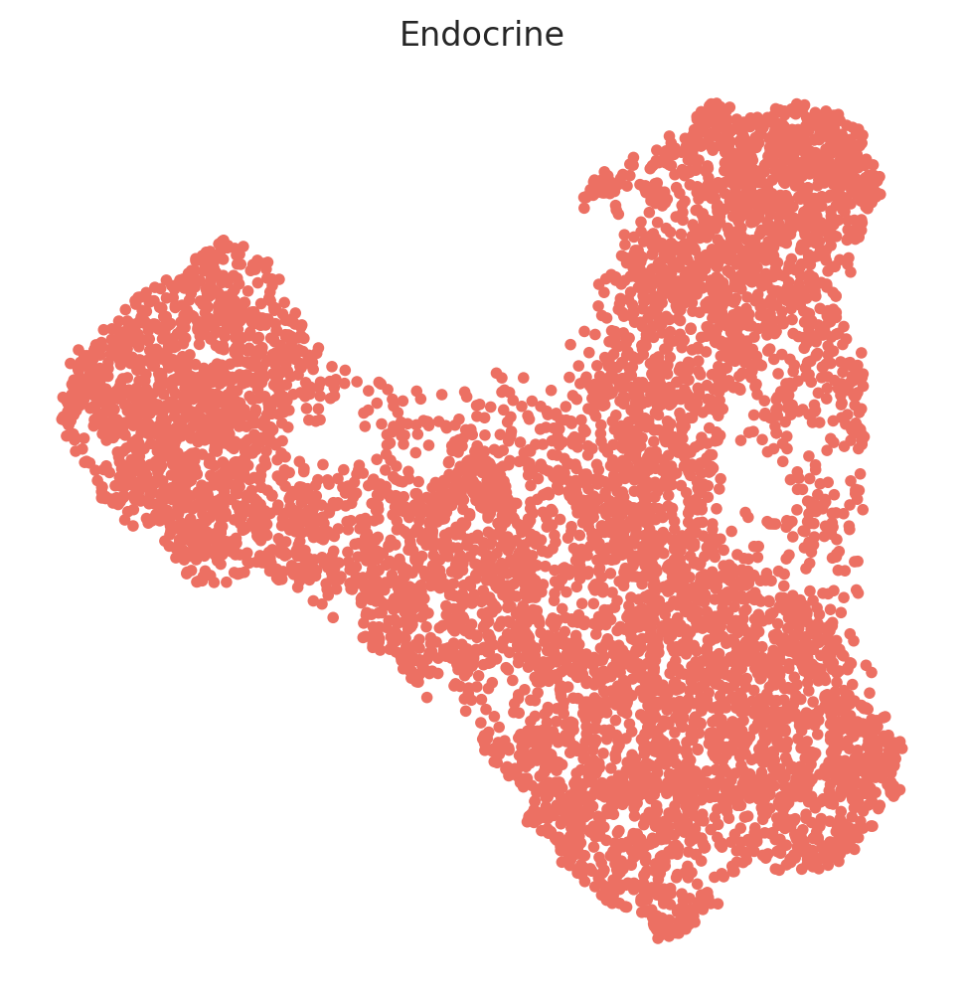

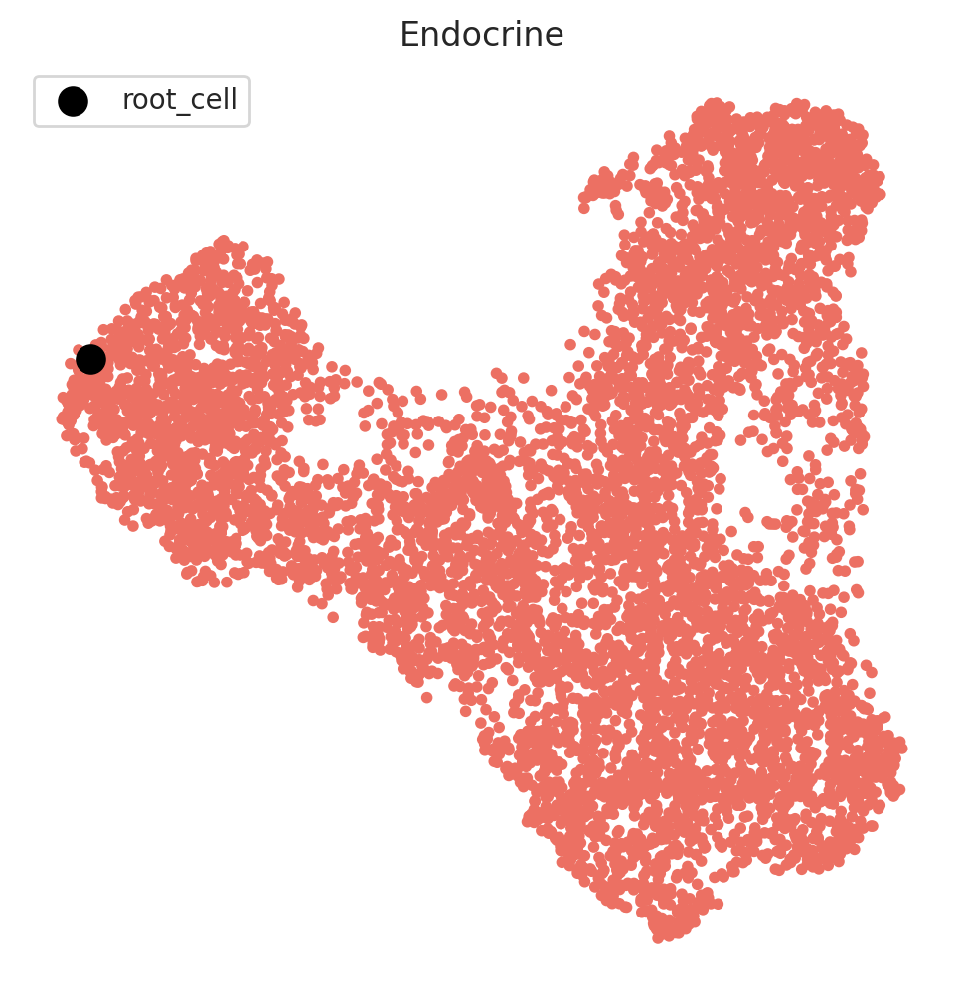

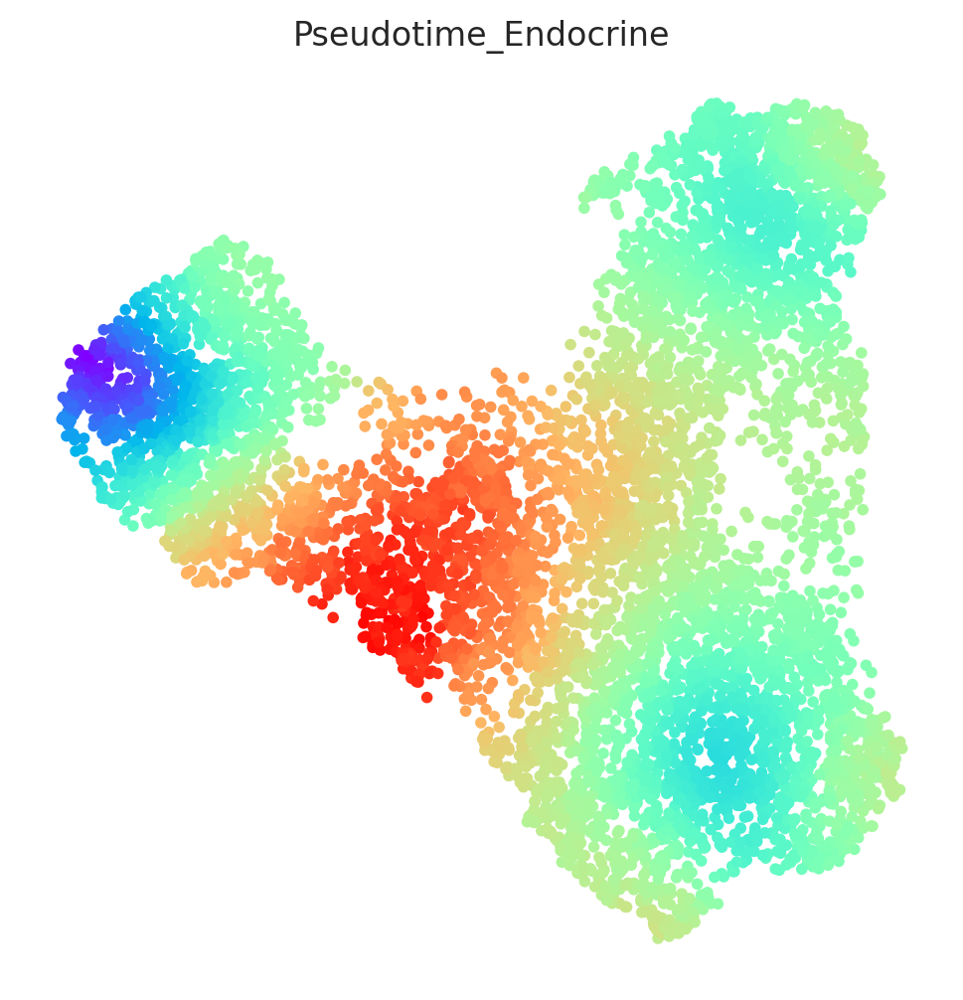

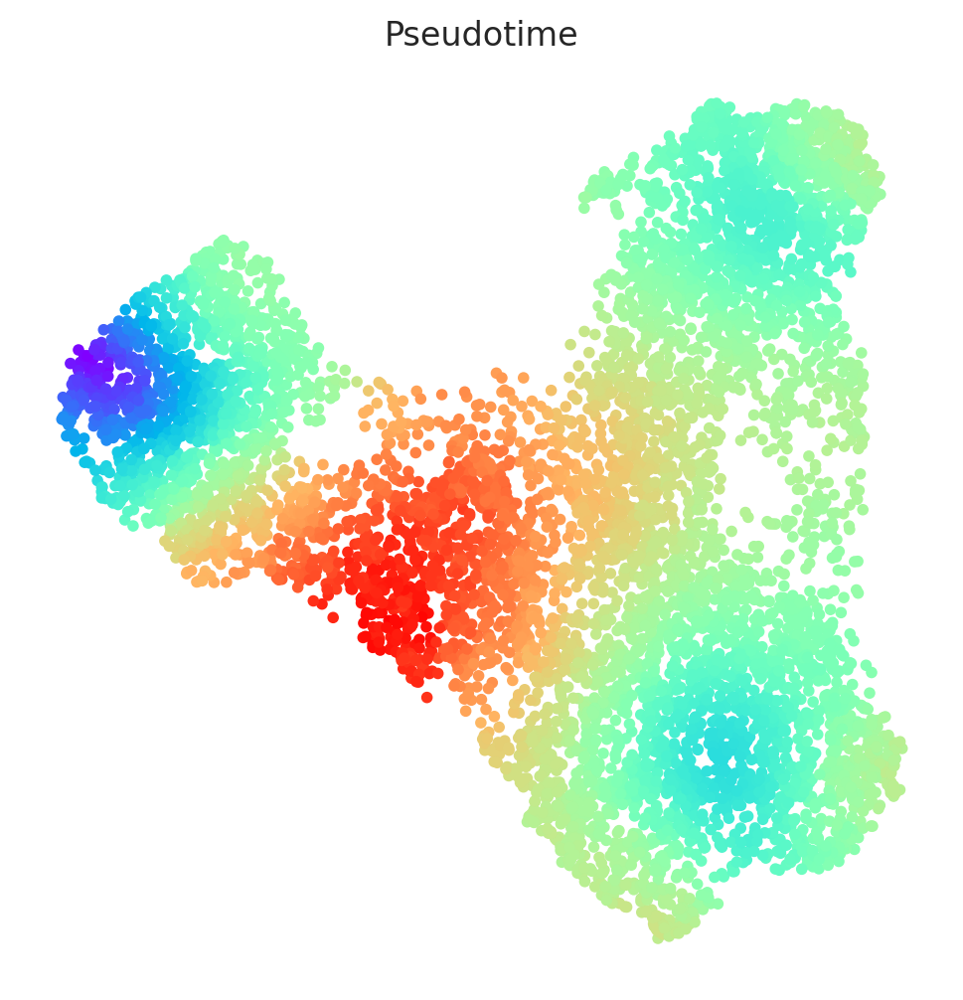

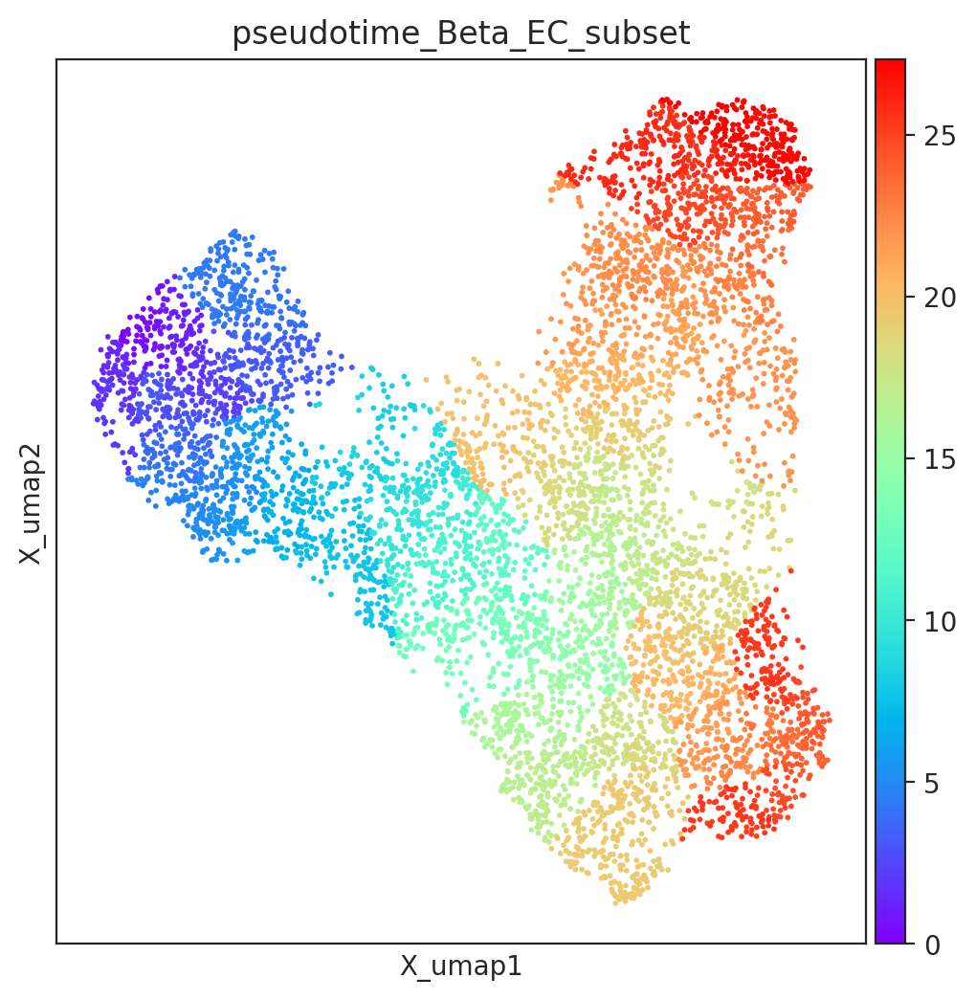

In [22]:
#Pseudotime
import celloracle as co
from celloracle.applications import Pseudotime_calculator

# Instantiate pseudotime object using oracle object.
pt = Pseudotime_calculator(oracle_object=oracle)

print("Clustering name: ", pt.cluster_column_name)
print("Cluster list", pt.cluster_list)

# Check data
pt.plot_cluster(fontsize=8)

    # Here, clusters can be classified into specific lineages
    
clusters_end_lineage = ["eEP", 'lEP', "EC","Beta",'Beta-EC']
    
    # Make a dictionary
lineage_dictionary = {"Endocrine": clusters_end_lineage}
    
    # Input lineage information into pseudotime object
pt.set_lineage(lineage_dictionary=lineage_dictionary)
    
    # Visualize lineage information
pt.plot_lineages()
    
    # Estimated root cell name for each lineage
root_cells = {"Endocrine": "s5d3_GAGTCAAAGTTCCTCA-1_paired"}
pt.set_root_cells(root_cells=root_cells)
    # Check root cell and lineage (it has to be close to an edge)
pt.plot_root_cells()
    #"s5d5_AAACATGCAAAGCTCC-1" <- other root cell for s5d5
      
    # Calculate pseudotime
pt.get_pseudotime_per_each_lineage()
    
    # Check results
pt.plot_pseudotime(cmap="rainbow")
      
    # Add calculated pseudotime data to the oracle object
oracle.adata.obs = pt.adata.obs
      
    # Visualize pseudotime
    
fig, ax = plt.subplots(figsize=[6,6])
sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, 
                      ax=ax, cmap="rainbow",
                      color=["pseudotime_Beta_EC_subset"])
      

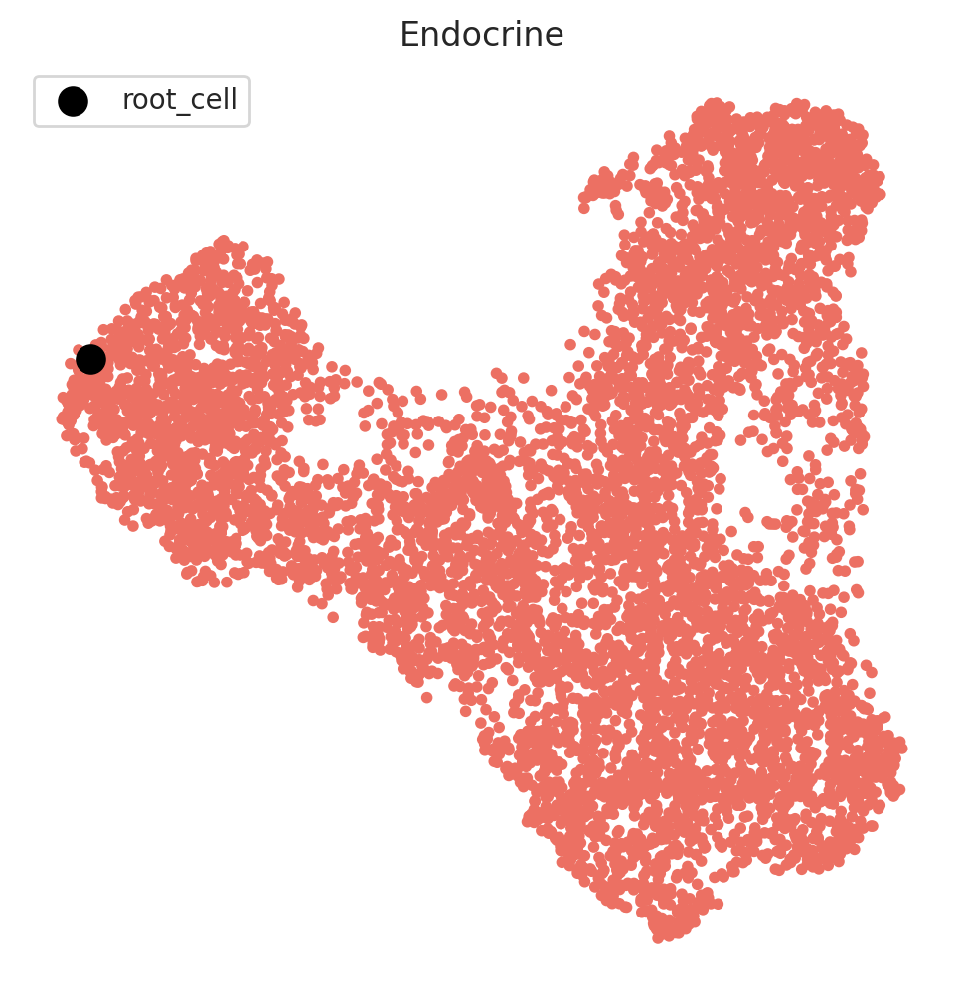

In [23]:
# Instantiate pseudotime object using oracle object.
pt = Pseudotime_calculator(oracle_object=oracle)
root_cells = {"Endocrine": "s5d3_GAGTCAAAGTTCCTCA-1_paired"}
pt.set_root_cells(root_cells=root_cells)
pt.plot_root_cells()


In [24]:
# Save oracle object.
oracle.to_hdf5("checkpoints/celloracle/DT_Subset_EC_Beta.celloracle.oracle")


In [25]:
# Load file.
oracle = co.load_hdf5("checkpoints/celloracle/DT_Subset_EC_Beta.celloracle.oracle")


# GRN Calculations

In [26]:
#Get GRNs

#%%time
# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="celltype_Beta_EC_subset", alpha=10,
                         verbose_level=10)


  0%|          | 0/5 [00:00<?, ?it/s]

Inferring GRN for Beta...


  0%|          | 0/2809 [00:00<?, ?it/s]

Inferring GRN for Beta-EC...


  0%|          | 0/2809 [00:00<?, ?it/s]

Inferring GRN for EC...


  0%|          | 0/2809 [00:00<?, ?it/s]

Inferring GRN for eEP...


  0%|          | 0/2809 [00:00<?, ?it/s]

Inferring GRN for lEP...


  0%|          | 0/2809 [00:00<?, ?it/s]

# Network preprocessing

Beta


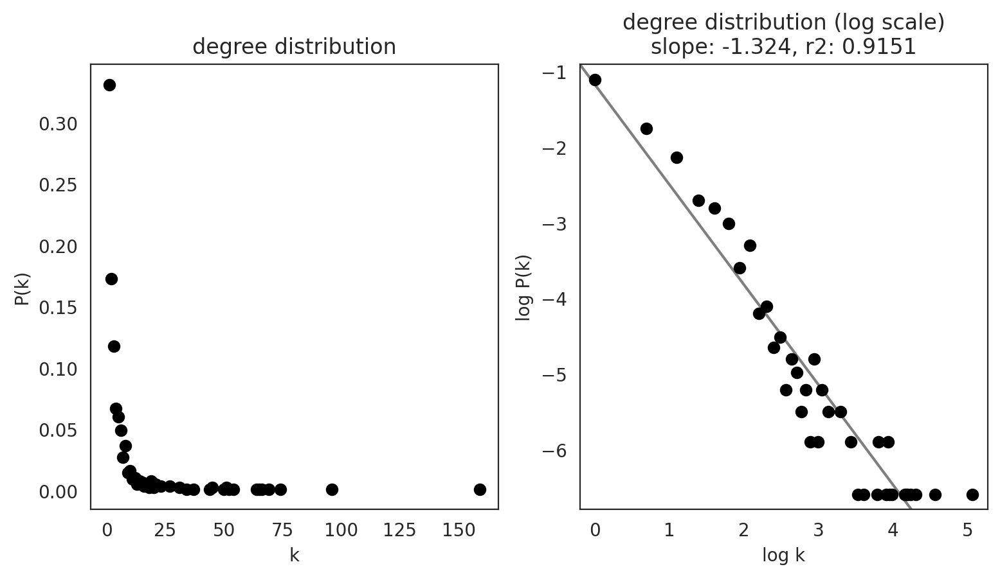

Beta-EC


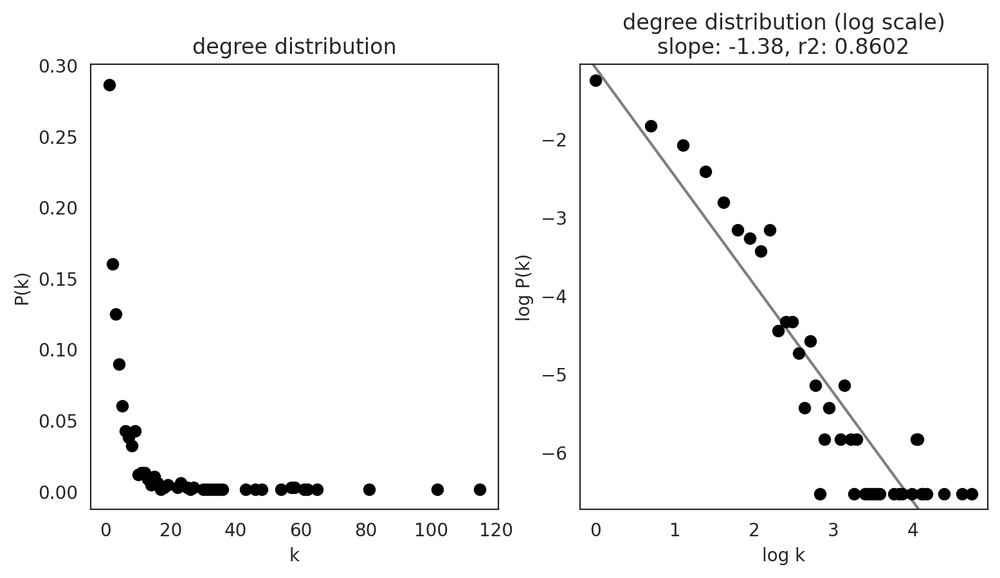

EC


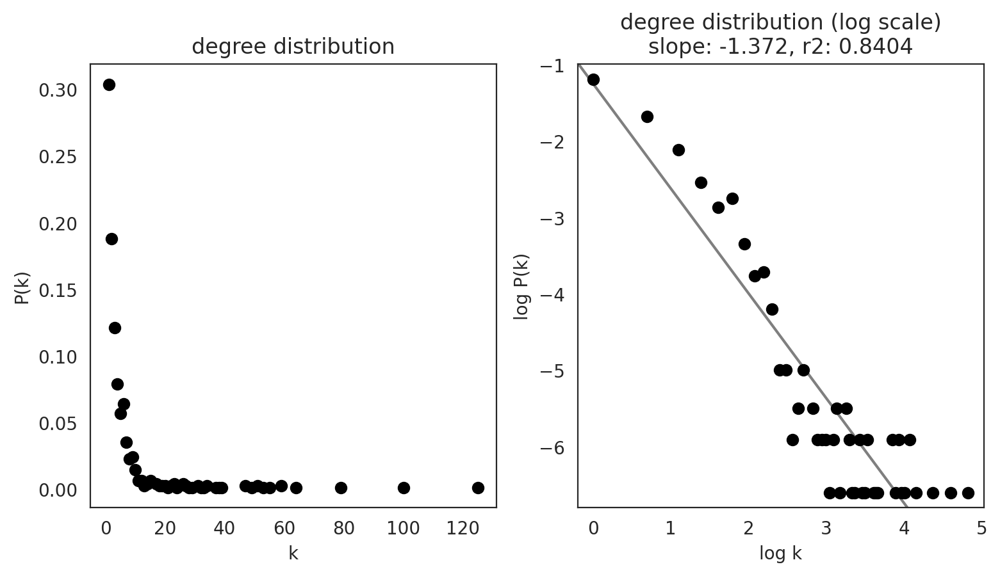

eEP


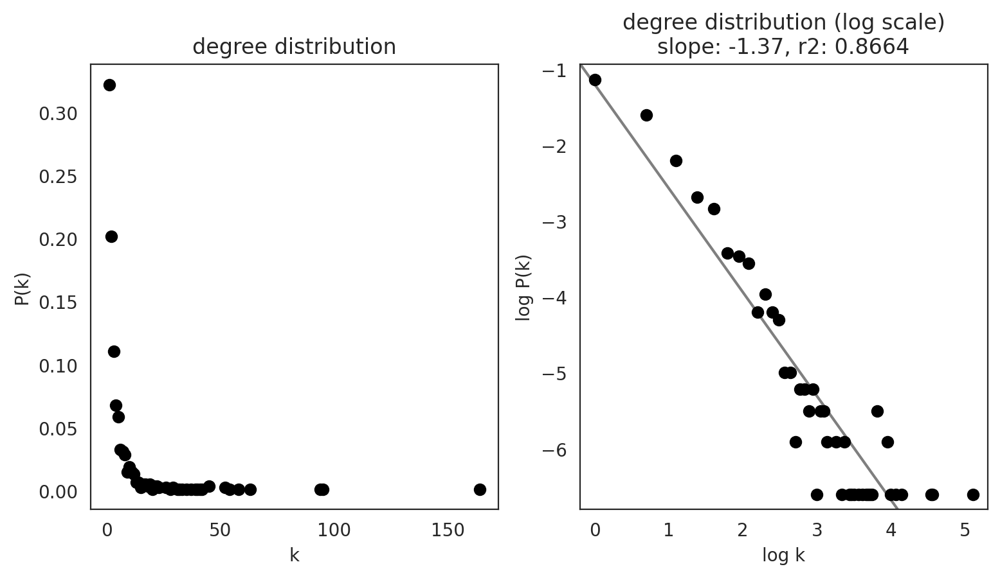

lEP


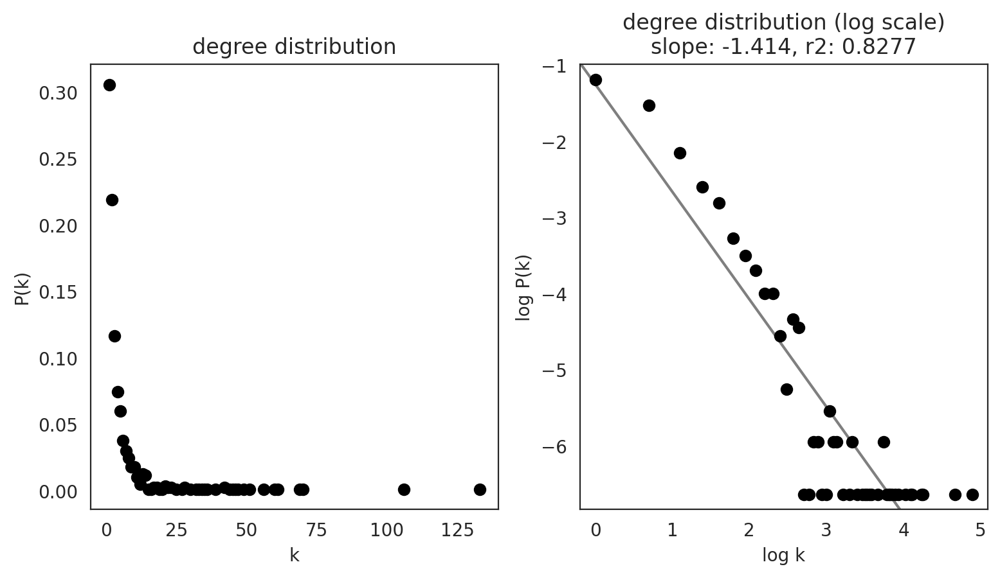

In [27]:
#Filter network edges

links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)
plt.rcParams["figure.figsize"] = [9, 4.5]

links.plot_degree_distributions(plot_model=True) 
plt.rcParams["figure.figsize"] = [6, 4.5]

In [28]:
# Calculate network scores and Save Links object.
links.get_network_score()
links.merged_score.tail()
links.to_hdf5(file_path="checkpoints/celloracle/DT_Subset_EC_Beta.celloracle.links")


# Network analysis

In [9]:
# You can load files with the following command.
links = co.load_hdf5(file_path="checkpoints/celloracle/DT_Subset_EC_Beta.celloracle.links")

In [10]:
# Check cluster name
links.cluster


['Beta', 'Beta-EC', 'EC', 'eEP', 'lEP']

In [11]:
# Save GRN as csv
net_scores = links.merged_score
net_scores.to_csv("outputs/celloracle_tables/Network_Scores_per_Cluster_DT_Subset_EC_Beta_paper.csv")

## Top Degree Centrality

In [12]:
Centrality_all = pd.read_csv("outputs/celloracle_tables/Network_Scores_per_Cluster_DT_Subset_EC_Beta_paper.csv").rename(columns={"Unnamed: 0": "gene"})
Centrality_all.head(1) 

,gene,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
0,TCF12,159,0.218707,0,0.0,159,0.218707,0.0,1.0,Beta


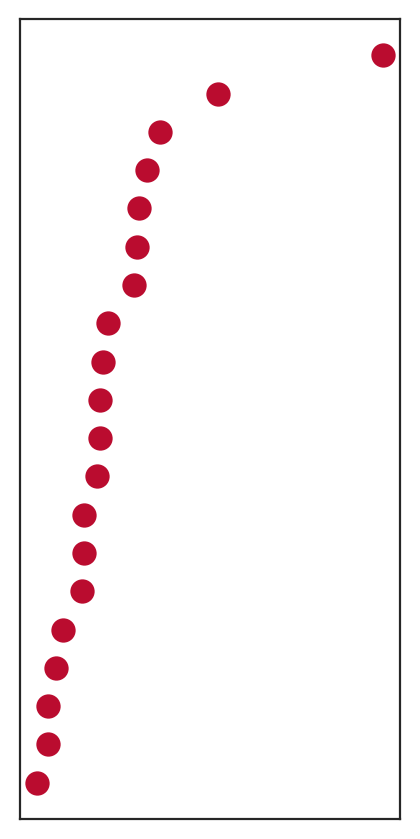

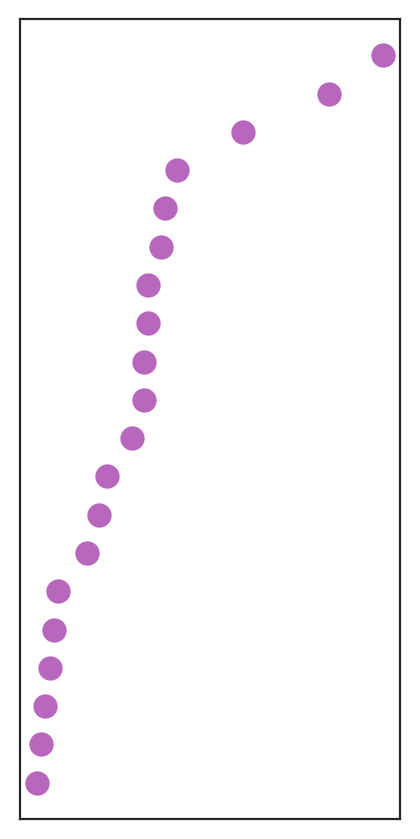

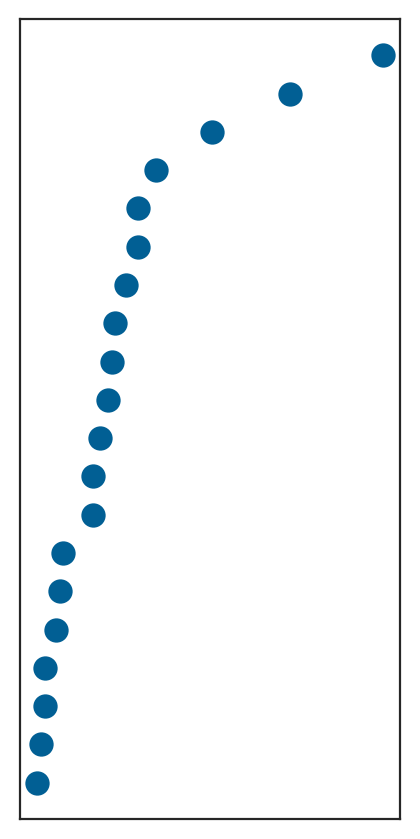

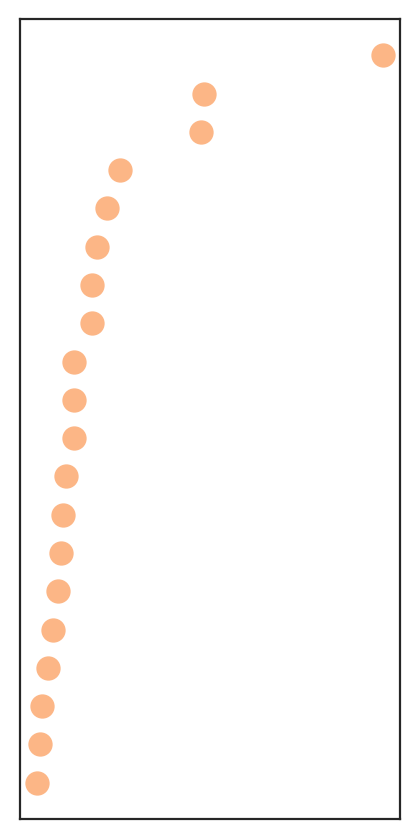

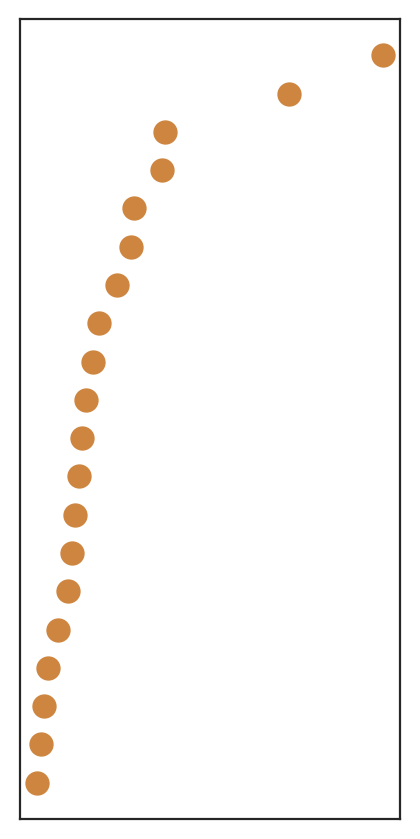

Saved clean dot plots to: outputs/celloracle_figures/DT_Subset_EC_Beta


In [7]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# --- Build `top` (top 20 genes per cluster by degree_centrality_all) ---
df = Centrality_all[["gene", "degree_centrality_all", "cluster"]].copy()
df = df.dropna(subset=["gene", "degree_centrality_all", "cluster"])
df["cluster"] = df["cluster"].astype(str).str.strip()
df["gene"] = df["gene"].astype(str).str.strip()
df["degree_centrality_all"] = pd.to_numeric(df["degree_centrality_all"], errors="coerce")
df = df.dropna(subset=["degree_centrality_all"])

# If duplicates exist, keep max per (cluster,gene)
df = df.groupby(["cluster", "gene"], as_index=False)["degree_centrality_all"].max()

top_n = 20
top = (
    df.sort_values(["cluster", "degree_centrality_all"], ascending=[True, False])
      .groupby("cluster", group_keys=False)
      .head(top_n)
)

# --- Palette ---
pal = {
    "Mesench.": "#ffbd00",
    "UE": "#EE3377",
    "DE": "#a7defa",
    "GT": "#DDCC77",
    "PP": "#402bad",
    "Exocrine": "#117733",
    "eEP": "#fcb686",
    "lEP": "#cd853f",
    "Alpha": "#f55e07",
    "Delta": "#7d9e31",
    "EC": "#015f94",
    "Beta": "#ba0c2f",
    "Beta-EC": "#b867bf",
}

# --- Plot (dots), no labels, keep box, save tightly (no white ribbon) ---
save_folder = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(save_folder, exist_ok=True)

for cluster, sub in top.groupby("cluster"):
    sub = sub.sort_values("degree_centrality_all", ascending=False).reset_index(drop=True)
    sub["rank"] = sub.index + 1

    fig, ax = plt.subplots(figsize=(1.9, 4))
    cluster_color = pal.get(cluster, "#9e9e9e")

    ax.scatter(sub["degree_centrality_all"], sub["rank"], s=60, marker="o", c=cluster_color)
    ax.invert_yaxis()

    ax.set_title("")
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_xlabel("")

    out_png = os.path.join(save_folder, f"rank_top{top_n}_{cluster}_dots_clean.png")

    # Fill the whole canvas with the axes (box) and save with zero padding
    ax.set_position([0, 0, 1, 1])
    fig.savefig(out_png, dpi=600, bbox_inches="tight", pad_inches=0)

    plt.show()
    plt.close(fig)

print(f"Saved clean dot plots to: {save_folder}")


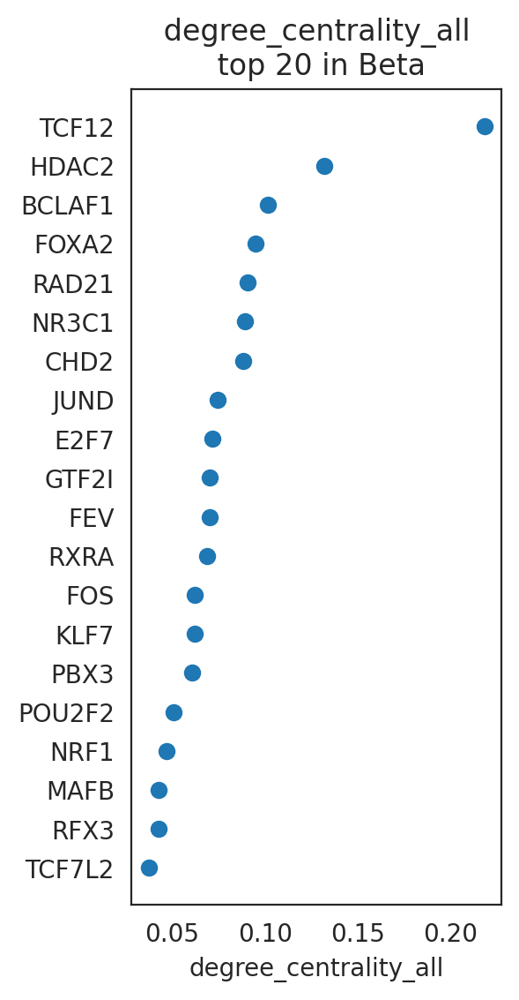

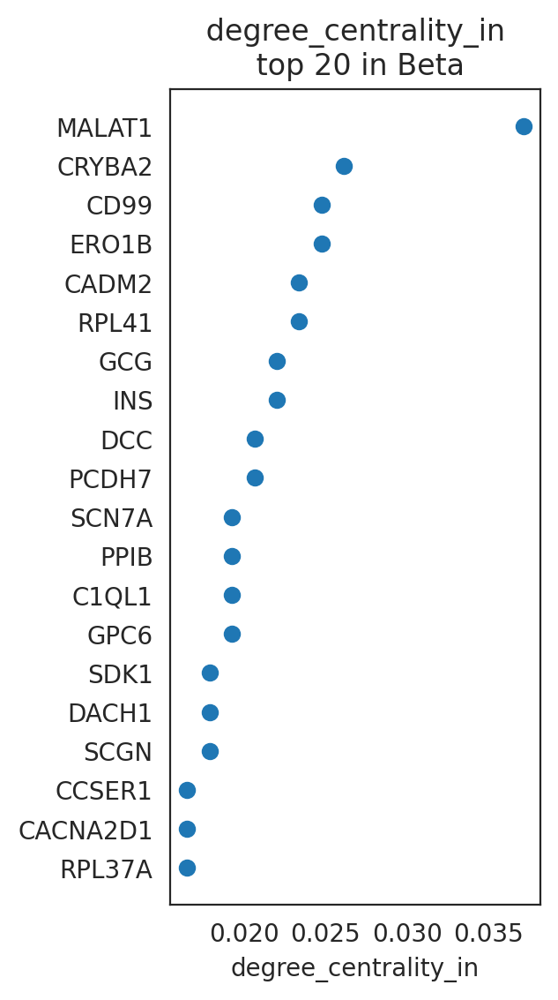

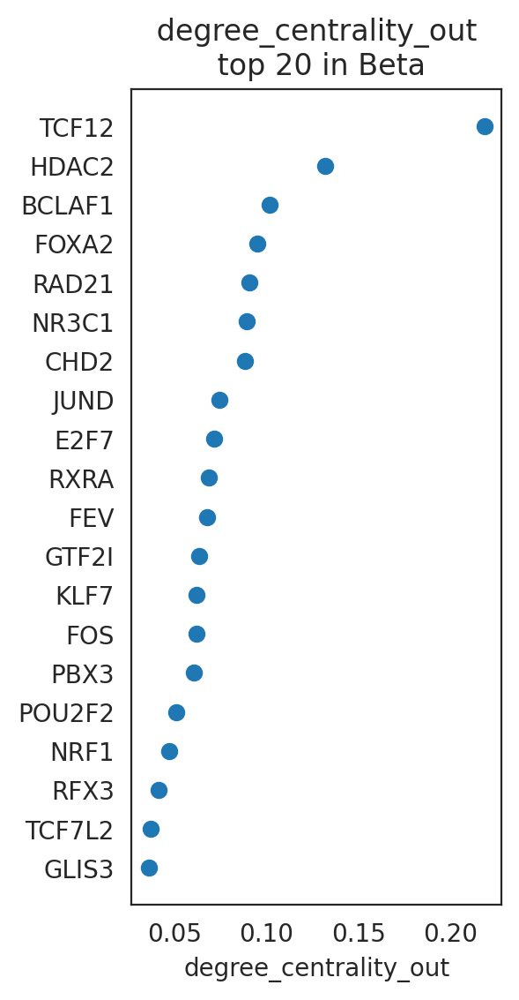

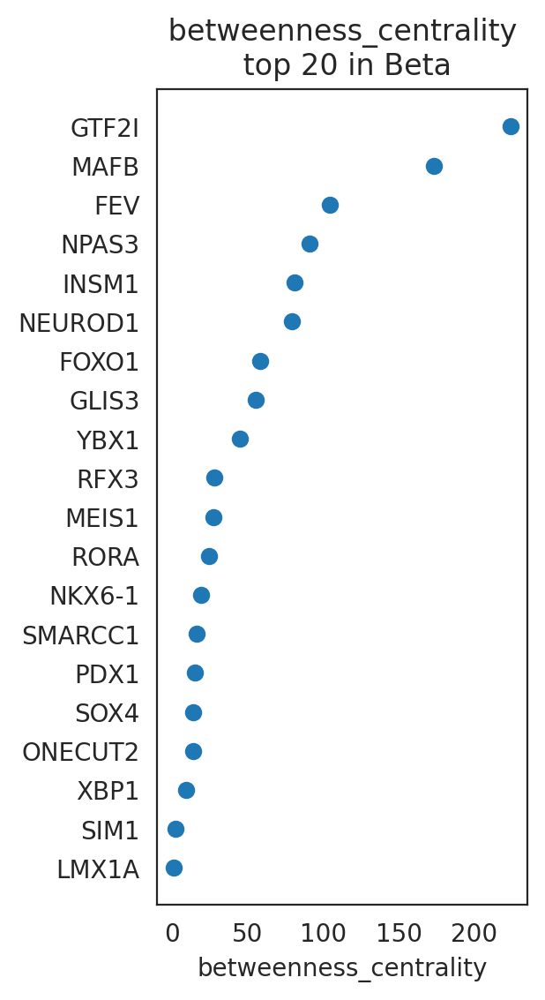

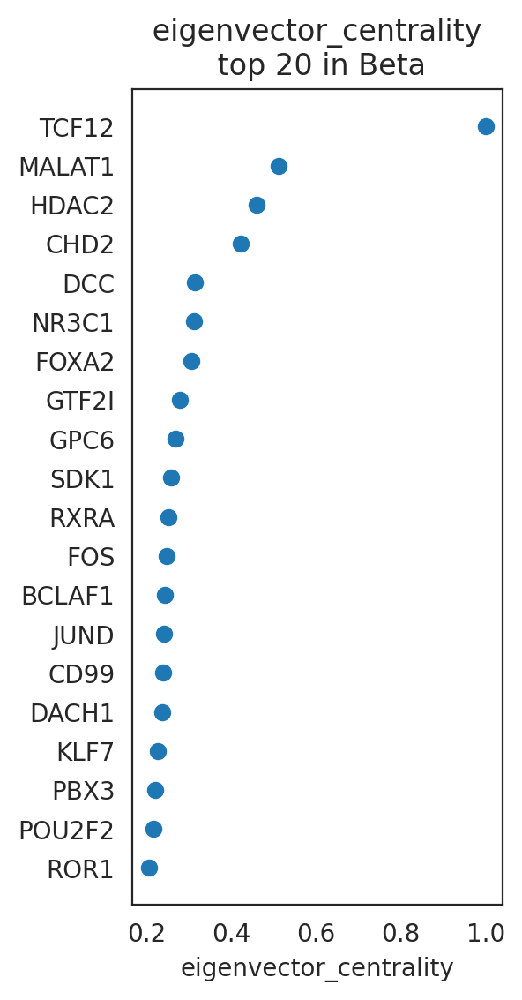

...

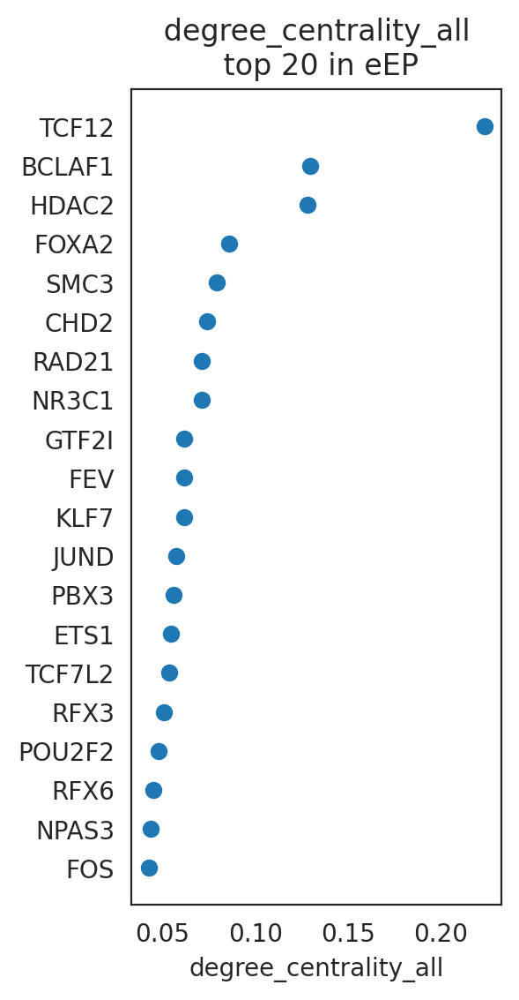

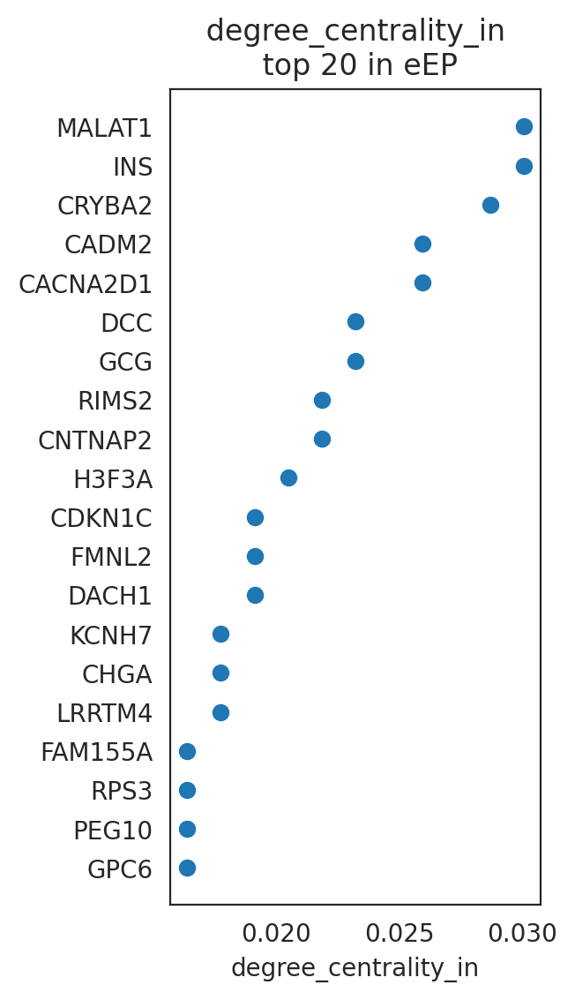

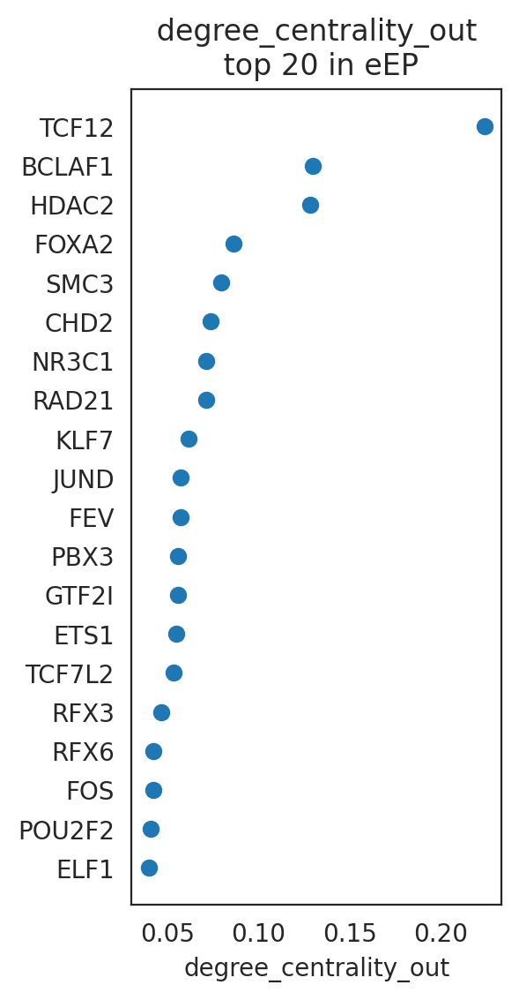

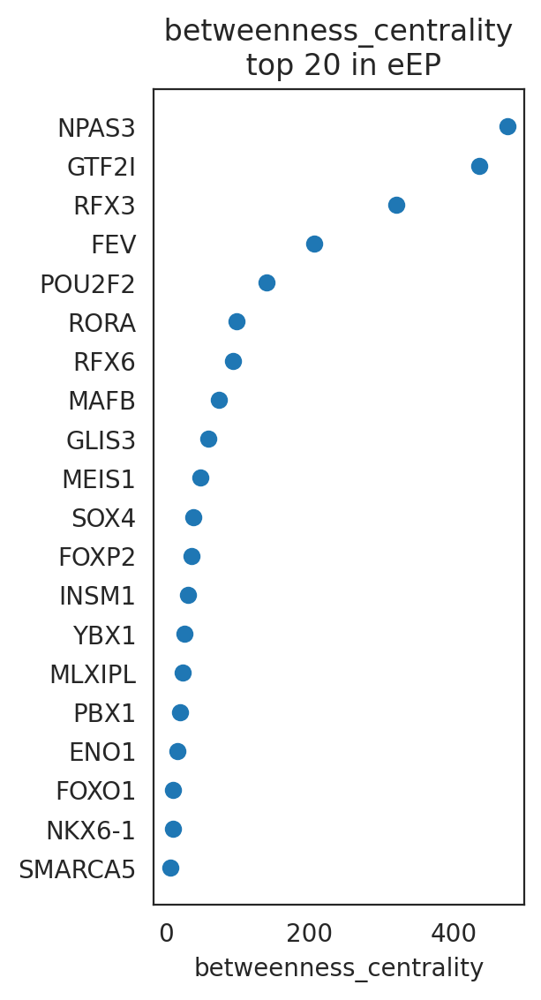

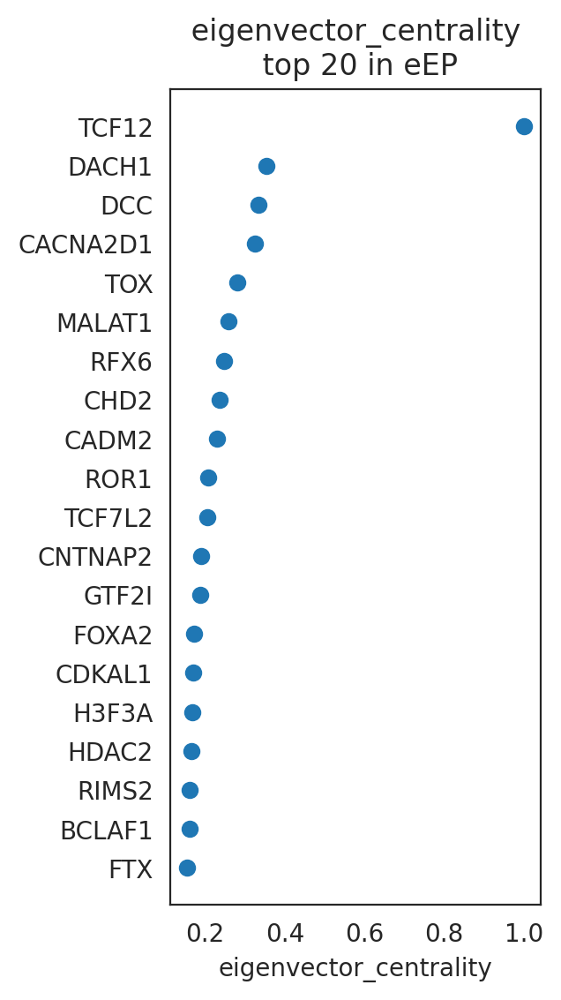

In [8]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="Beta", 
                          n_gene=20, save=f"{save_folder}/ranked_score")
links.plot_scores_as_rank(cluster="Beta-EC", 
                          n_gene=20, save=f"{save_folder}/ranked_score")
links.plot_scores_as_rank(cluster="EC", 
                          n_gene=20, save=f"{save_folder}/ranked_score")
links.plot_scores_as_rank(cluster="lEP", 
                          n_gene=20, save=f"{save_folder}/ranked_score")
links.plot_scores_as_rank(cluster="eEP", 
                          n_gene=20, save=f"{save_folder}/ranked_score")

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt

def plot_gene_centrality_across_clusters_equal_air(
    df, gene_of_interest, pal,
    cluster_order=None,
    save_folder="outputs/celloracle_figures/DT_Subset_EC_Beta",
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
):
    os.makedirs(save_folder, exist_ok=True)

    g = df[df["gene"] == gene_of_interest].copy()
    if g.empty:
        raise ValueError(f"{gene_of_interest} not found (check spelling/case).")

    # enforce custom order (e.g. DE, GT, PP)
    if cluster_order is not None:
        order_map = {c: i for i, c in enumerate(cluster_order)}
        g["order"] = g["cluster"].map(order_map).fillna(len(order_map) + 999).astype(int)
        g = g.sort_values(["order", "cluster"]).reset_index(drop=True)
    else:
        g = g.sort_values("degree_centrality_all", ascending=False).reset_index(drop=True)

    n = g.shape[0]

    # (Optional but usually nicer when swapping axes): make width scale with n, keep height fixed-ish
    height_in = width_in
    width_in = max(row_height_in * n, 0.03)

    # Dot diameter fixed at 0.1"
    D_pts = dot_diameter_in * 72.0
    s = np.pi * (D_pts / 2.0) ** 2  # area in pt^2

    x = np.arange(n)  # cluster index on X
    y = g["degree_centrality_all"].values  # centrality on Y
    colors = g["cluster"].map(pal).fillna("#9e9e9e").values

    fig, ax = plt.subplots(figsize=(width_in, height_in), dpi=dpi)

    # ---- SWAP: (x,y) becomes (index, centrality) ----
    ax.scatter(x, y, s=s, marker="o", c=colors)

    # Minimal axes (keep box)
    ax.set_title("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")

    # Make the axes fill the figure so there's no ribbon
    ax.set_position([0, 0, 1, 1])

    # Base limits (before adding inch-based padding)
    ymin = float(np.min(y))
    ymax = float(np.max(y))
    if ymax == ymin:
        ymax = ymin + 1e-6

    # ---- PRINT min/max for PPT ----
    print(f"{gene_of_interest} degree_centrality_all min = {ymin:.6g}")
    print(f"{gene_of_interest} degree_centrality_all max = {ymax:.6g}")

    ax.set_xlim(-0.5, n - 0.5)
    ax.set_ylim(ymin, ymax)

    # --- Compute EXACT padding in data units for equal air in inches ---
    clear_in = (dot_diameter_in / 2.0) + air_in   # 0.05" + 0.01" = 0.06"
    clear_px = clear_in * dpi

    fig.canvas.draw()  # ensure transforms are ready

    # x padding in data units (at mid y)
    y_mid = (ymin + ymax) / 2
    p0 = ax.transData.transform((-0.5, y_mid))
    x1, _ = ax.transData.inverted().transform((p0[0] + clear_px, p0[1]))
    pad_x = x1 - (-0.5)

    # y padding in data units (at mid x)
    x_mid = (n - 1) / 2 if n > 1 else 0
    p0y = ax.transData.transform((x_mid, ymin))
    _, y1 = ax.transData.inverted().transform((p0y[0], p0y[1] + clear_px))
    pad_y = y1 - ymin

    ax.set_xlim(-0.001 - pad_x, (n - 0.999) + pad_x)
    ax.set_ylim(ymin - pad_y, ymax + pad_y)

    out_png = os.path.join(save_folder, f"{gene_of_interest}_degree_centrality_all.png")
    fig.savefig(out_png, dpi=dpi, pad_inches=0)  # keep symmetry

    plt.show()
    plt.close(fig)

    # Return path 
    return out_png


HDAC2 degree_centrality_all min = 0.128415
HDAC2 degree_centrality_all max = 0.169118


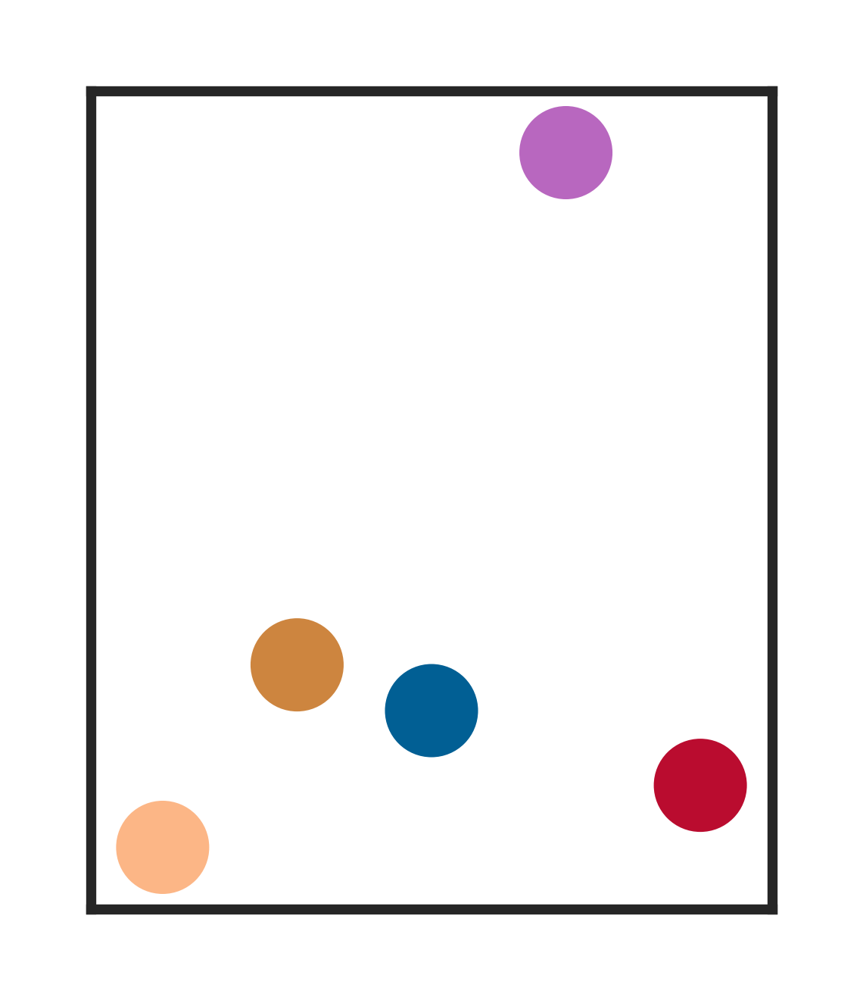

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/HDAC2_degree_centrality_all.png


In [10]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="HDAC2",
    pal=pal,
    cluster_order=['eEP','lEP', "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

NEUROG3 degree_centrality_all min = 0.00273224
NEUROG3 degree_centrality_all max = 0.0117647


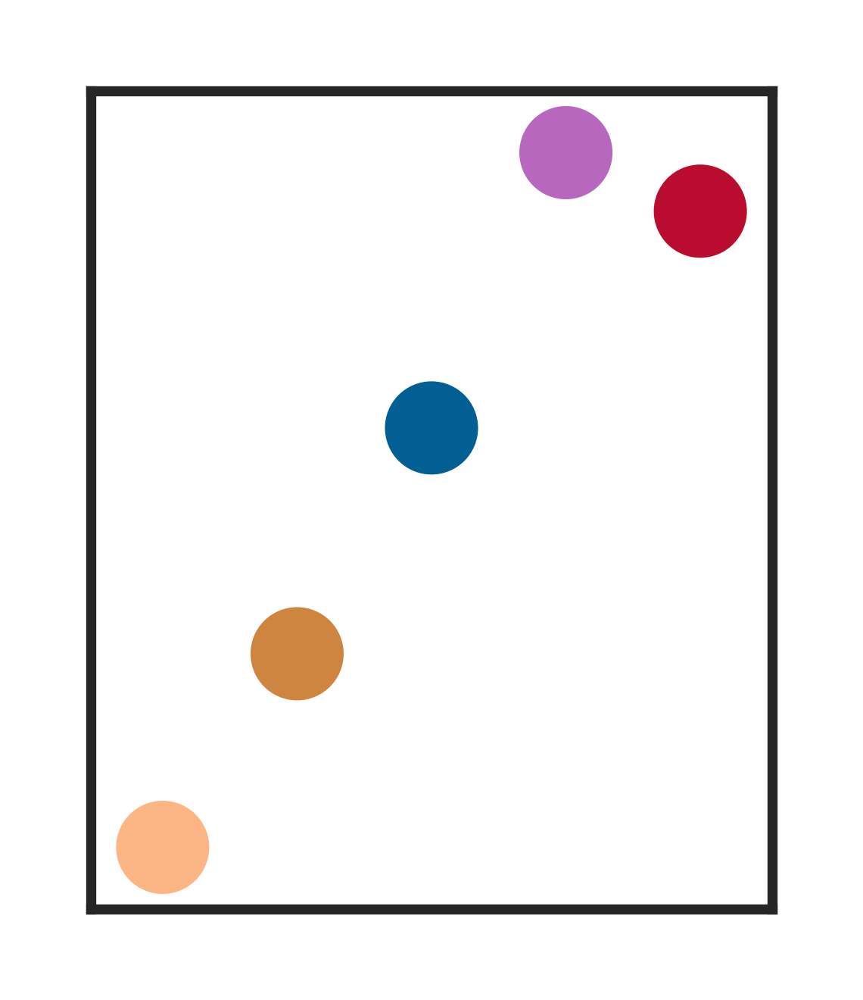

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/NEUROG3_degree_centrality_all.png


In [11]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="NEUROG3",
    pal=pal,
    cluster_order=['eEP','lEP', "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

FEV degree_centrality_all min = 0.0367454
FEV degree_centrality_all max = 0.0763984


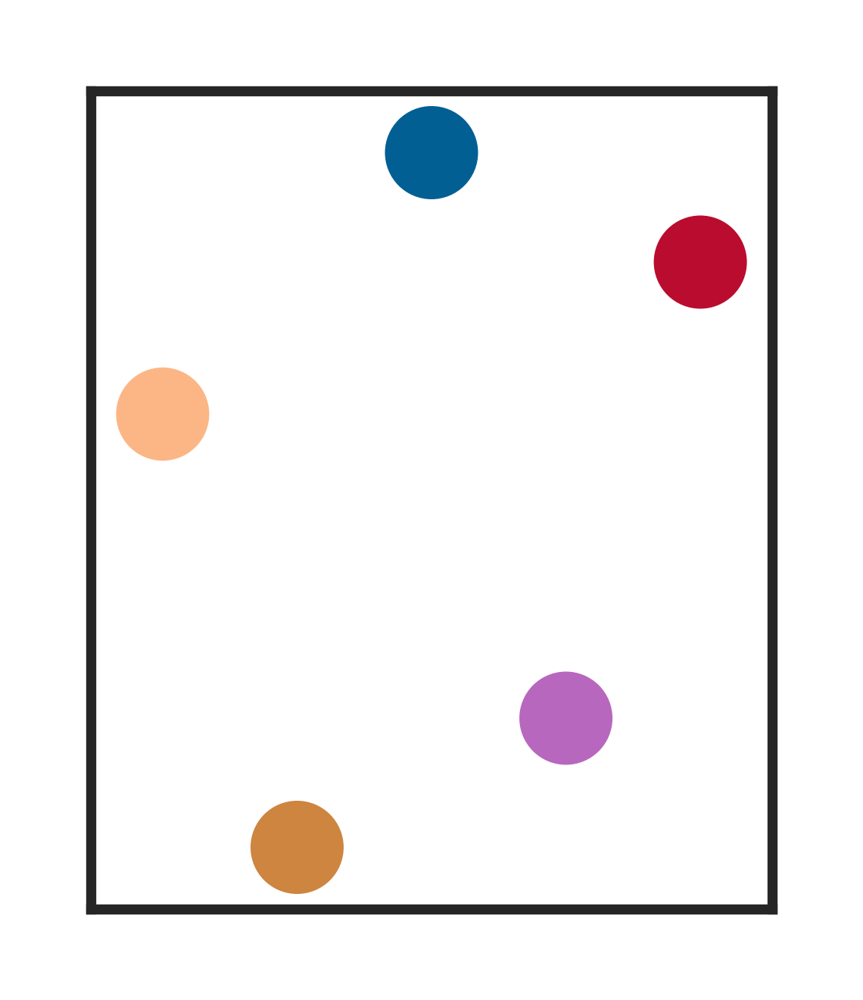

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/FEV_degree_centrality_all.png


In [21]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="FEV",
    pal=pal,
    cluster_order=['eEP','lEP', "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

TCF7L2 degree_centrality_all min = 0.0327422
TCF7L2 degree_centrality_all max = 0.0676471


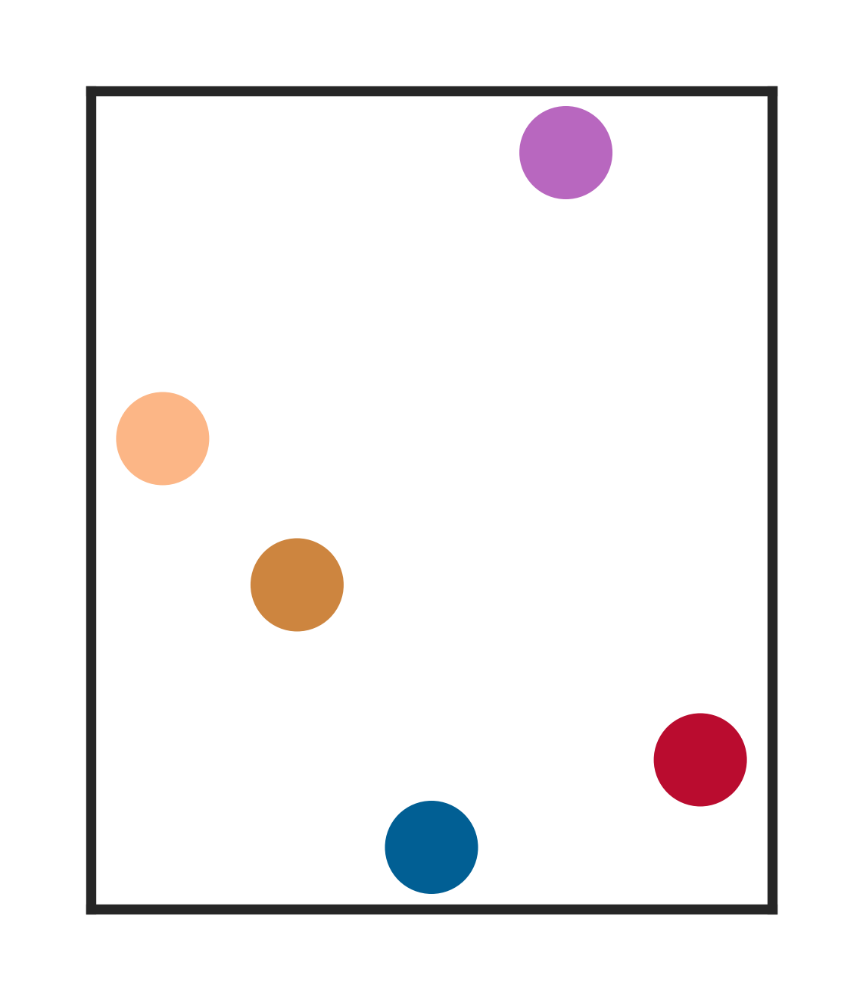

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/TCF7L2_degree_centrality_all.png


In [22]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="TCF7L2",
    pal=pal,
    cluster_order=['eEP','lEP', "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

ESRRG degree_centrality_all min = 0.00412655
ESRRG degree_centrality_all max = 0.010929


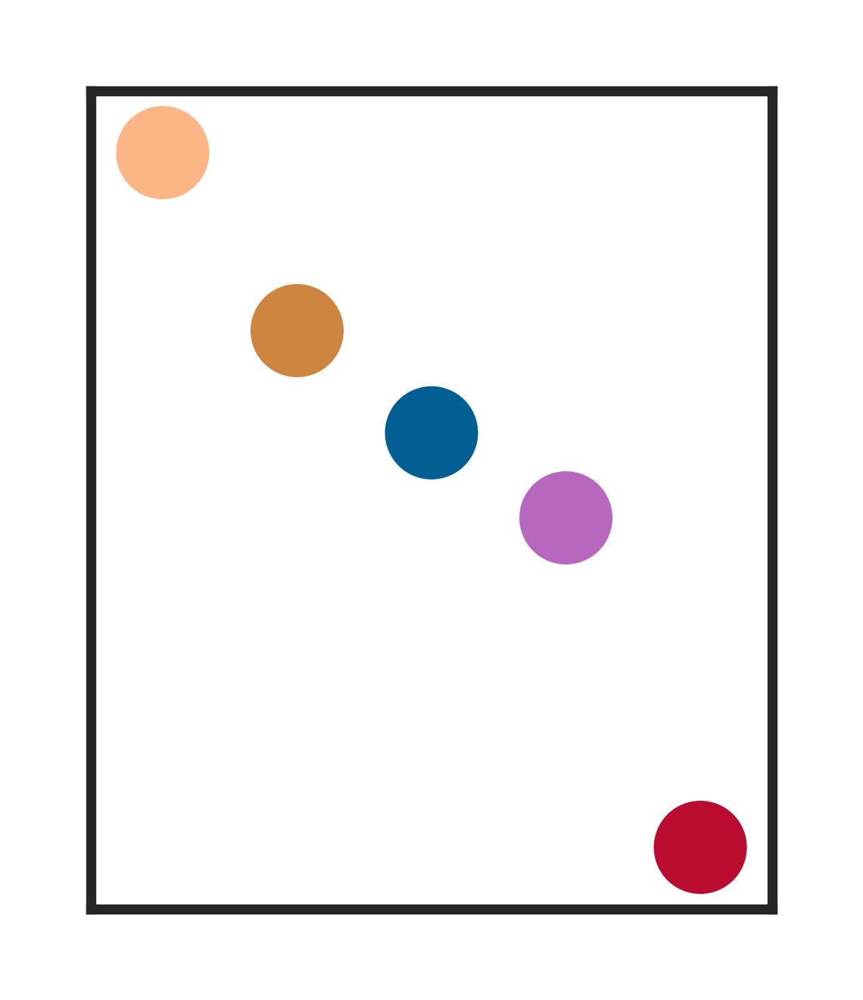

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/ESRRG_degree_centrality_all.png


In [23]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="ESRRG",
    pal=pal,
    cluster_order=['eEP','lEP', "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

KLF12 degree_centrality_all min = 0.0068306
KLF12 degree_centrality_all max = 0.0279412


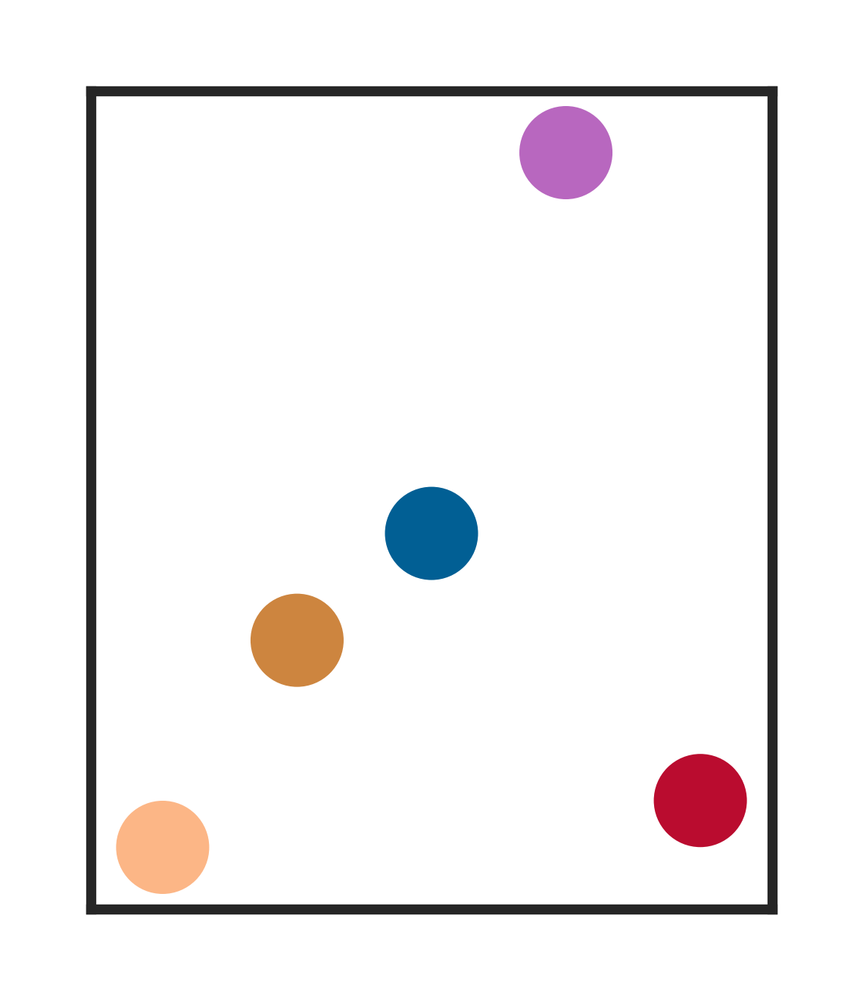

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/KLF12_degree_centrality_all.png


In [24]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="KLF12",
    pal=pal,
    cluster_order=['eEP','lEP', "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

LMX1A degree_centrality_all min = 0.00275103
LMX1A degree_centrality_all max = 0.0132353


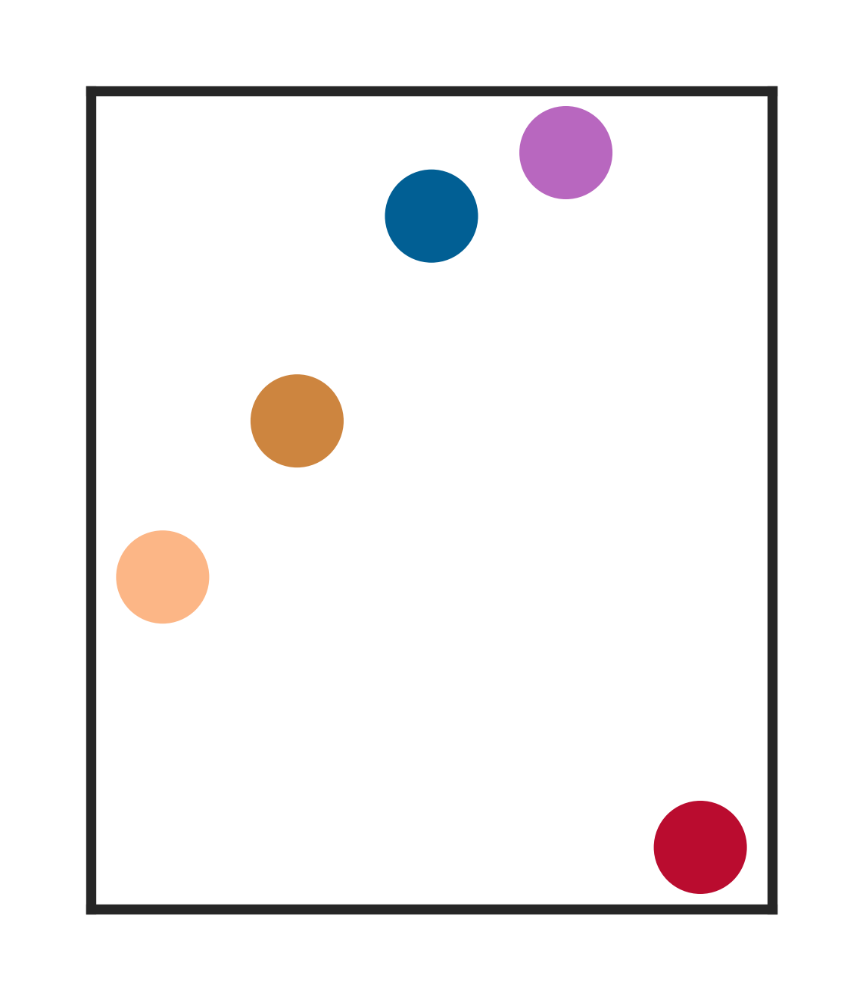

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/LMX1A_degree_centrality_all.png


In [25]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="LMX1A",
    pal=pal,
    cluster_order=['eEP','lEP',  "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

HNF4A degree_centrality_all min = 0.0150068
HNF4A degree_centrality_all max = 0.0273224


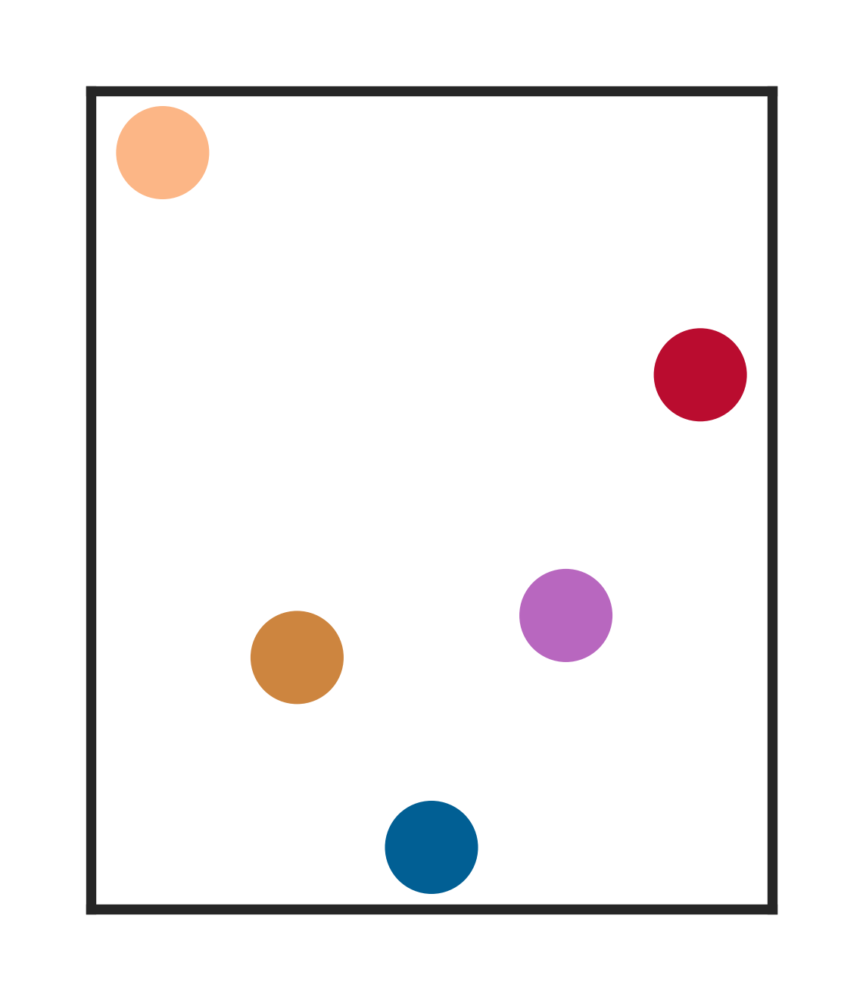

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/HNF4A_degree_centrality_all.png


In [26]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="HNF4A",
    pal=pal,
    cluster_order=['eEP','lEP',  "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

ZEB1 degree_centrality_all min = 0.0261348
ZEB1 degree_centrality_all max = 0.0911765


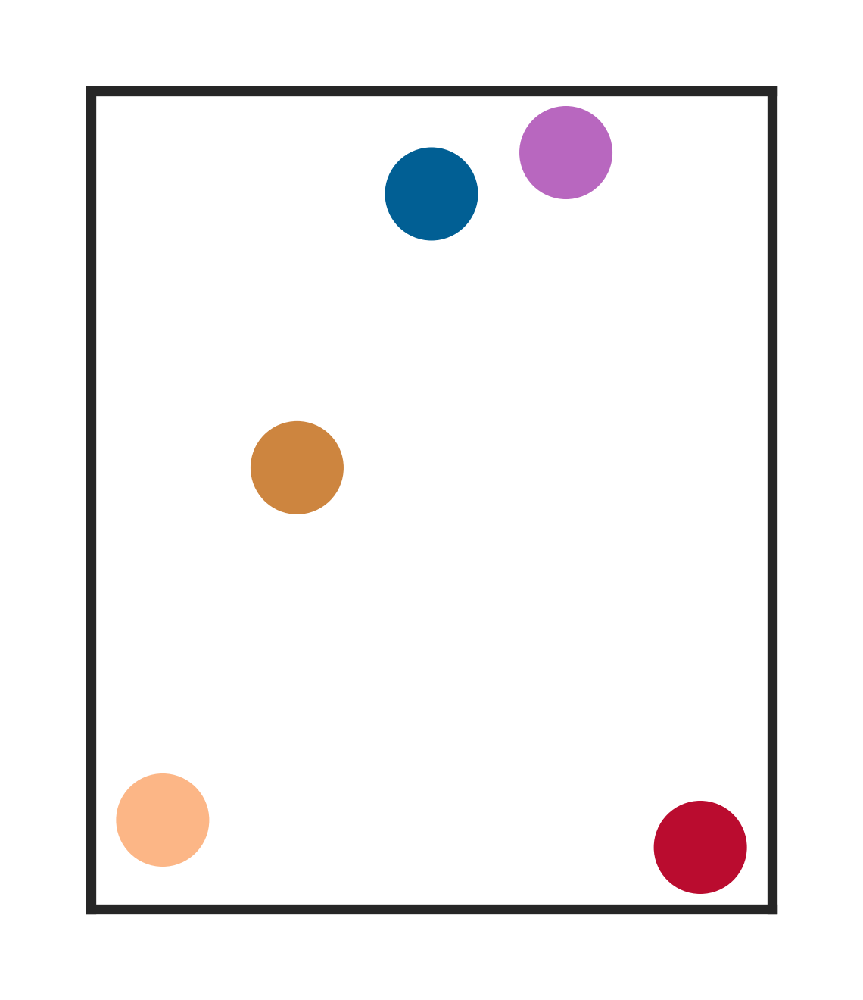

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_degree_centrality_all.png


In [27]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="ZEB1",
    pal=pal,
    cluster_order=['eEP','lEP',  "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

PAX4 degree_centrality_all min = 0.00131234
PAX4 degree_centrality_all max = 0.00550206


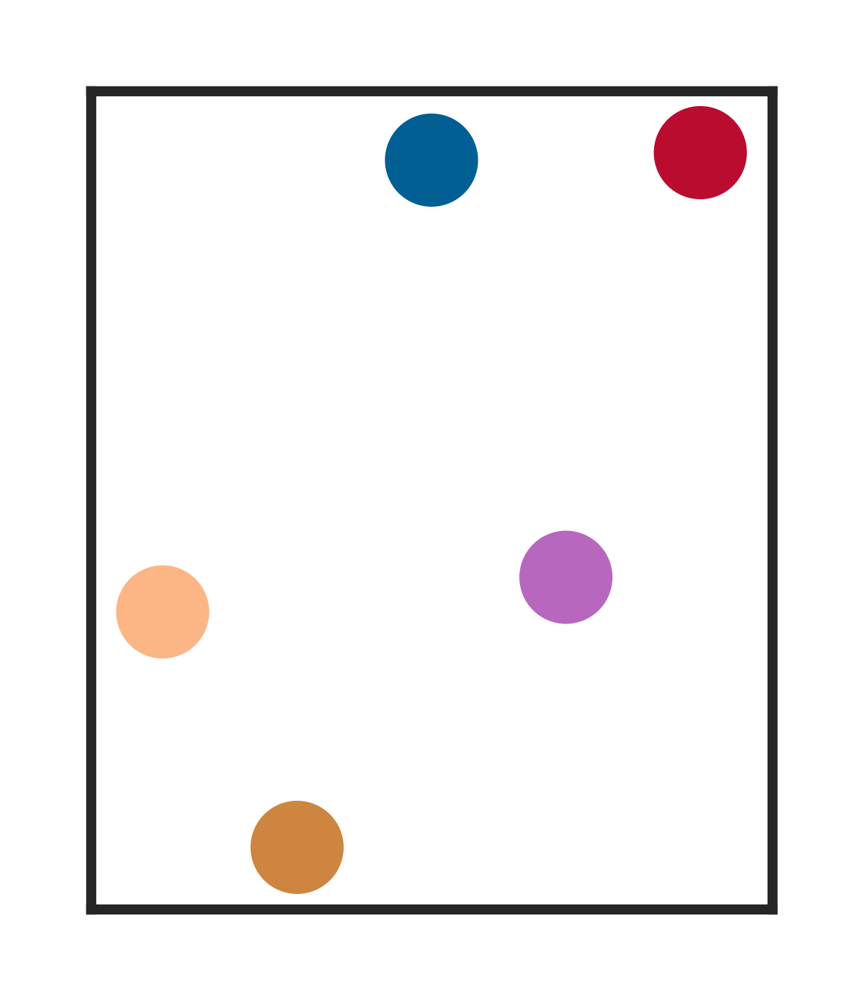

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/PAX4_degree_centrality_all.png


In [28]:
# Example
out = plot_gene_centrality_across_clusters_equal_air(
    df=df,
    gene_of_interest="PAX4",
    pal=pal,
    cluster_order=['eEP','lEP',  "EC","Beta-EC","Beta"],
    width_in=0.9,
    row_height_in=0.15,
    dot_diameter_in=0.1,
    air_in=0.03,
    dpi=600
)
print("Saved:", out)

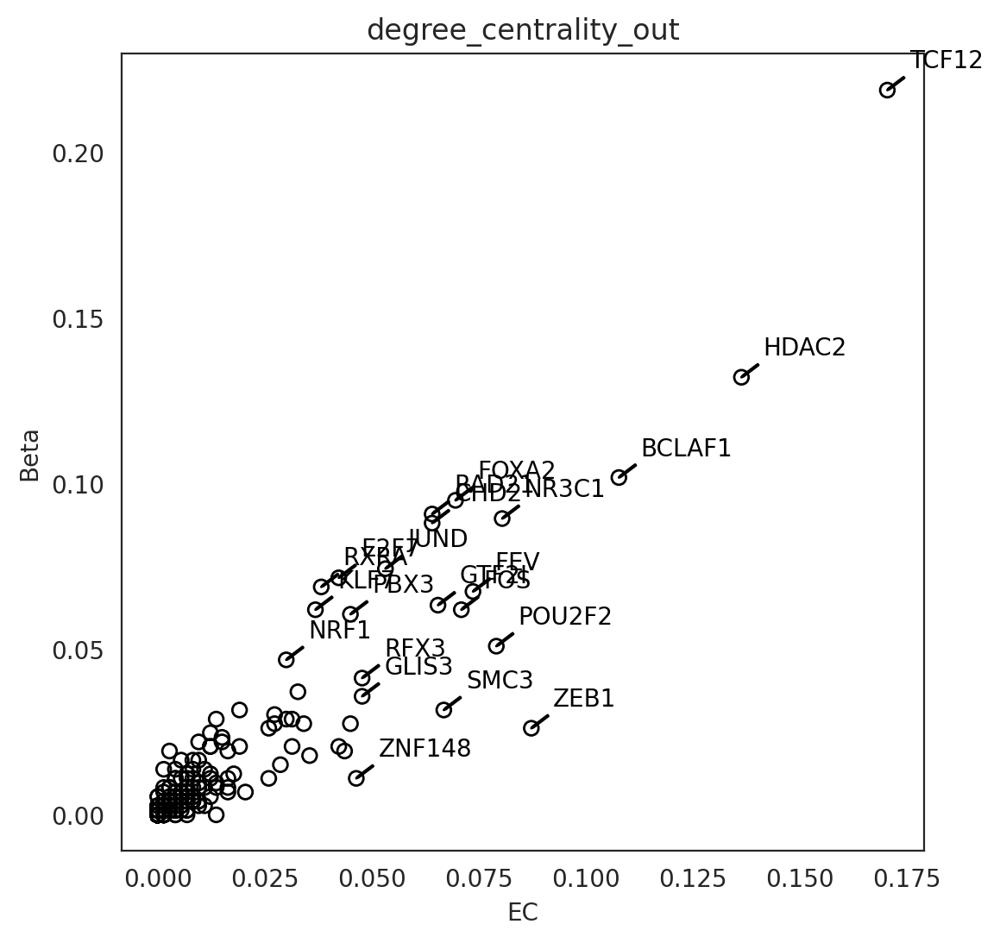

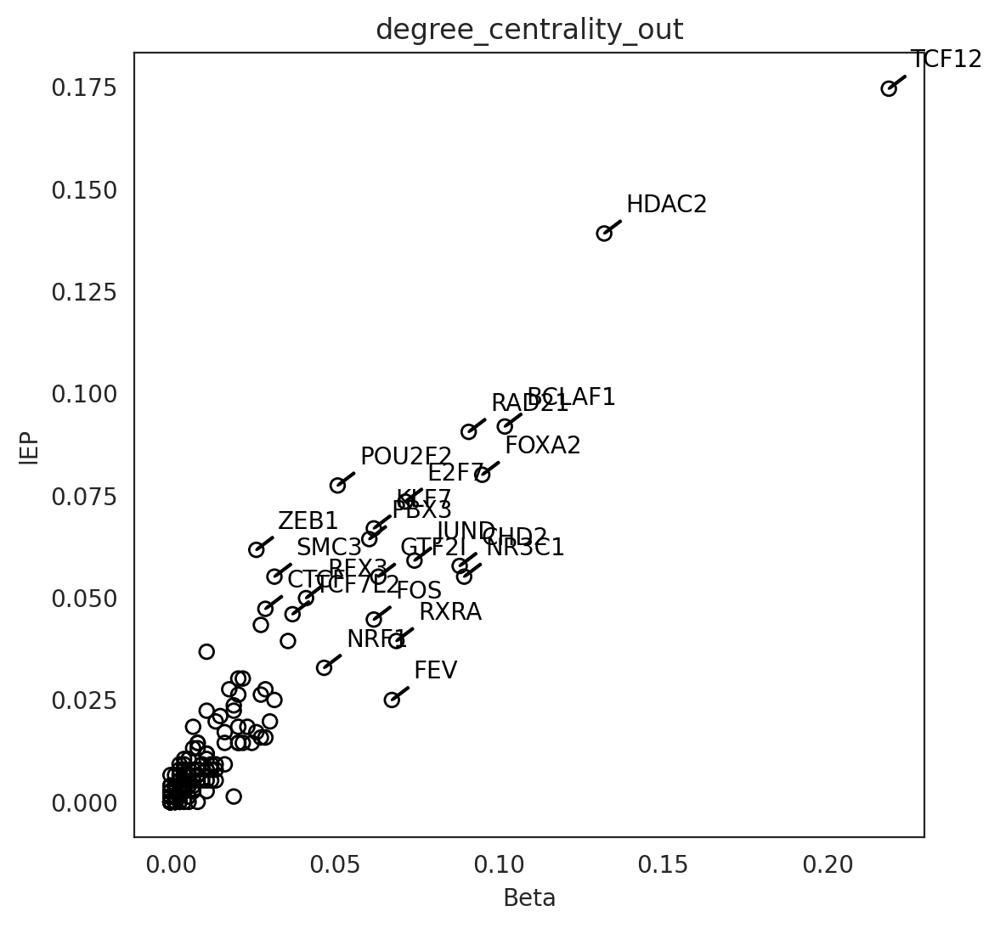

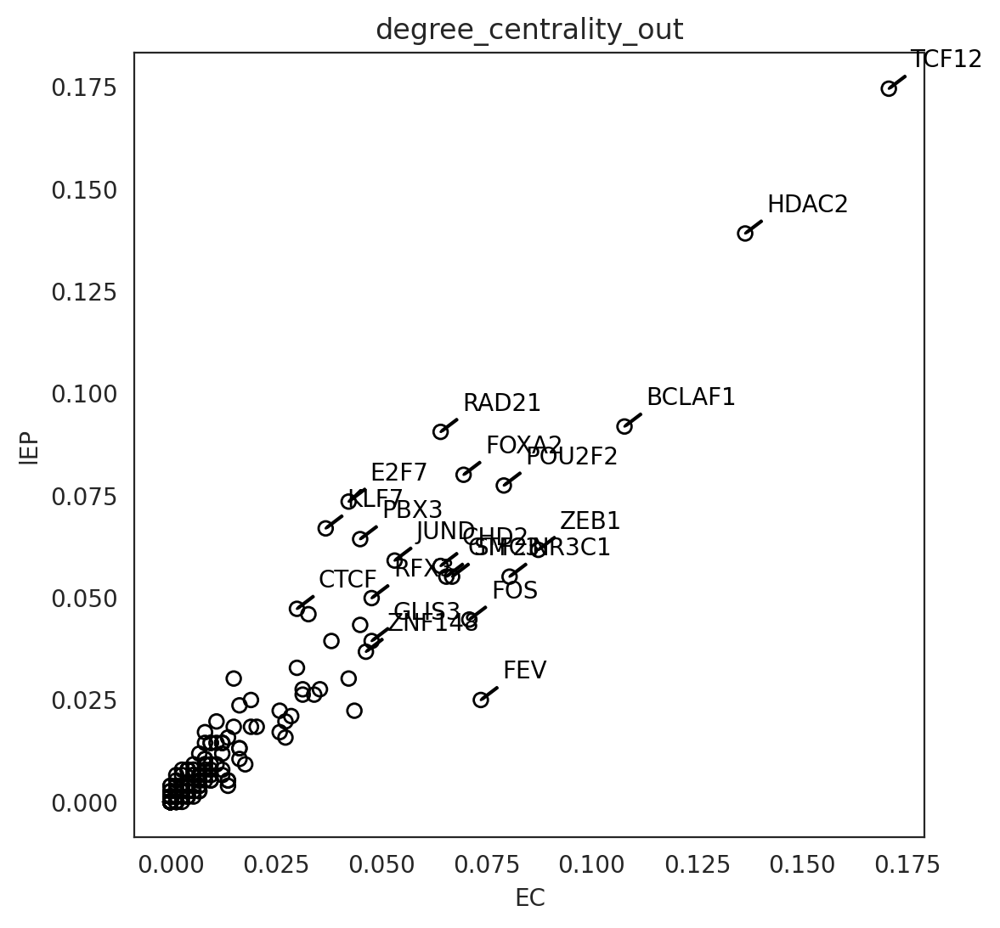

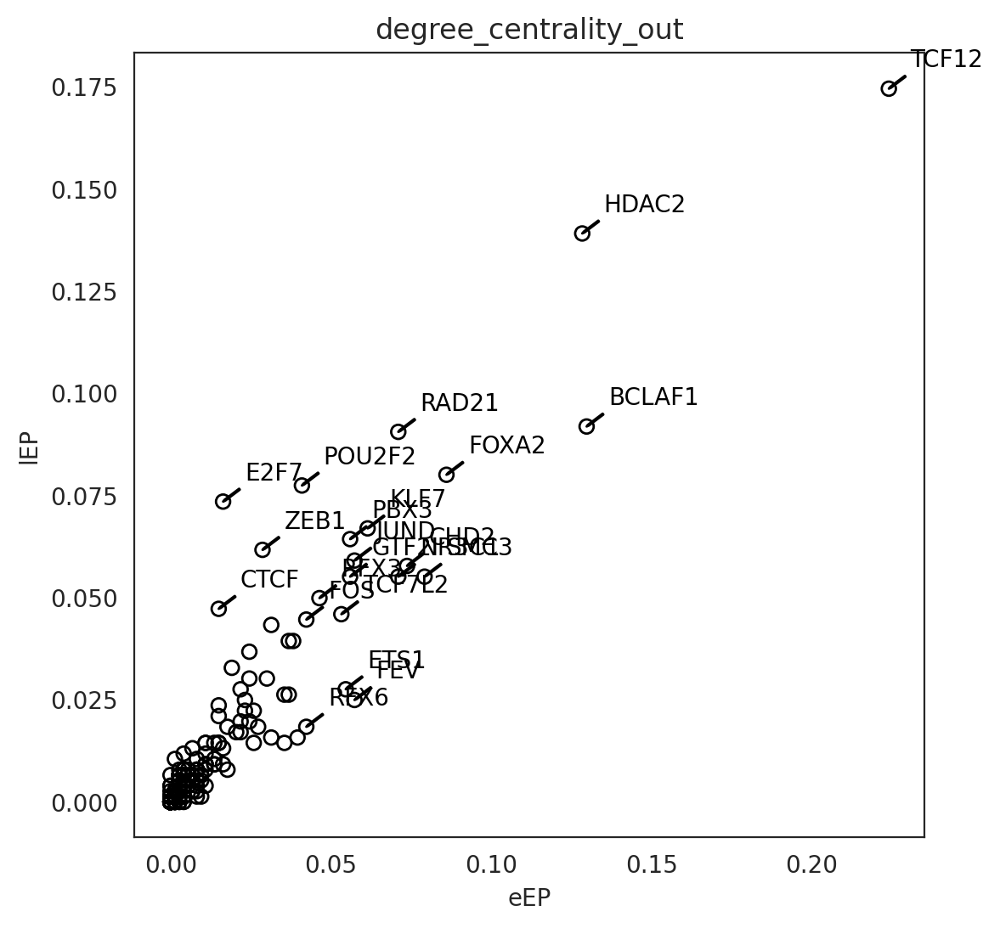

In [29]:
# Compare GRN score between two clusters
#Beta vs. EC

links.plot_score_comparison_2D(value="degree_centrality_out",
                               cluster1='EC', cluster2="Beta", 
                               percentile=98,
                               save=f"{save_folder}/score_comparison")

# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="degree_centrality_out",
                               cluster1="Beta", cluster2="lEP", 
                               percentile=98, 
                               save=f"{save_folder}/score_comparison")

# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="degree_centrality_out",
                               cluster1="EC", cluster2="lEP", 
                               percentile=98, save=f"{save_folder}/score_comparison")

# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="degree_centrality_out",
                               cluster1="eEP", cluster2="lEP", 
                               percentile=98, save=f"{save_folder}/score_comparison")


degree_centrality_all


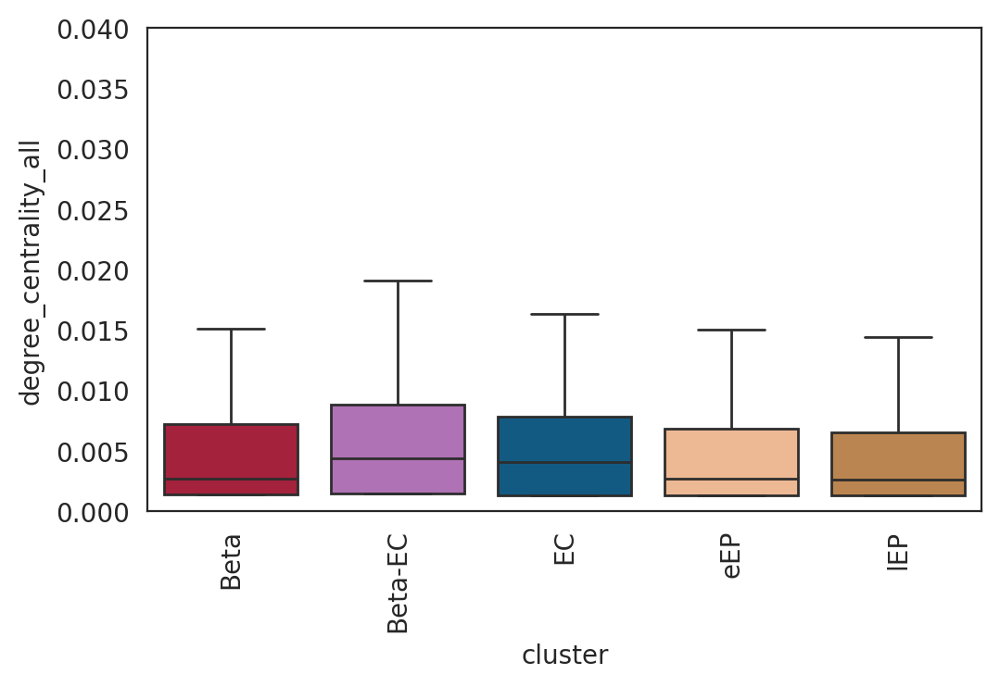

eigenvector_centrality


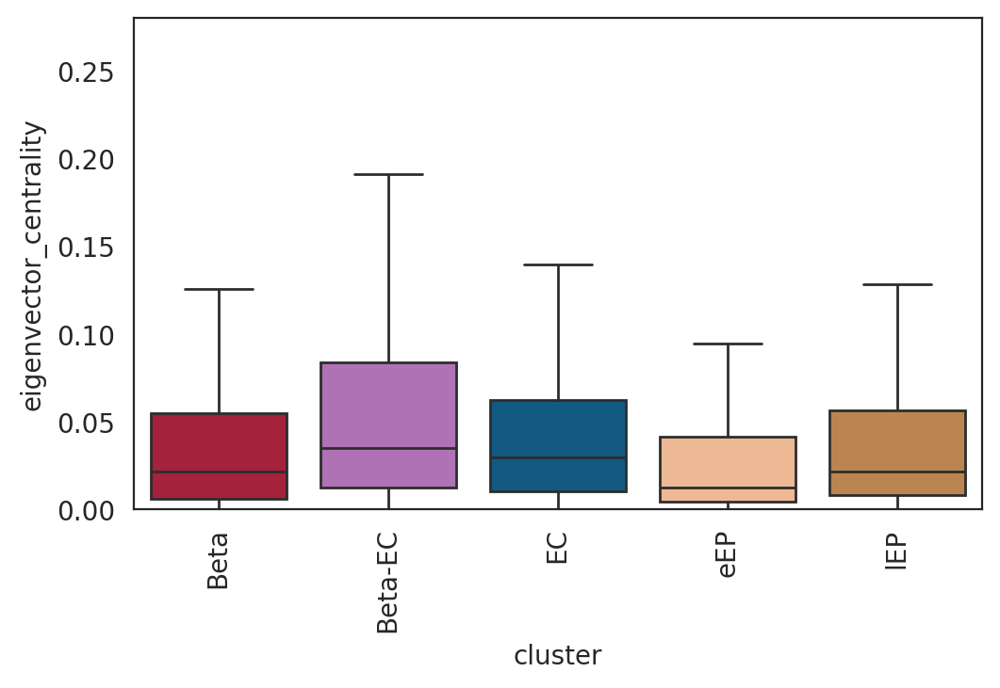

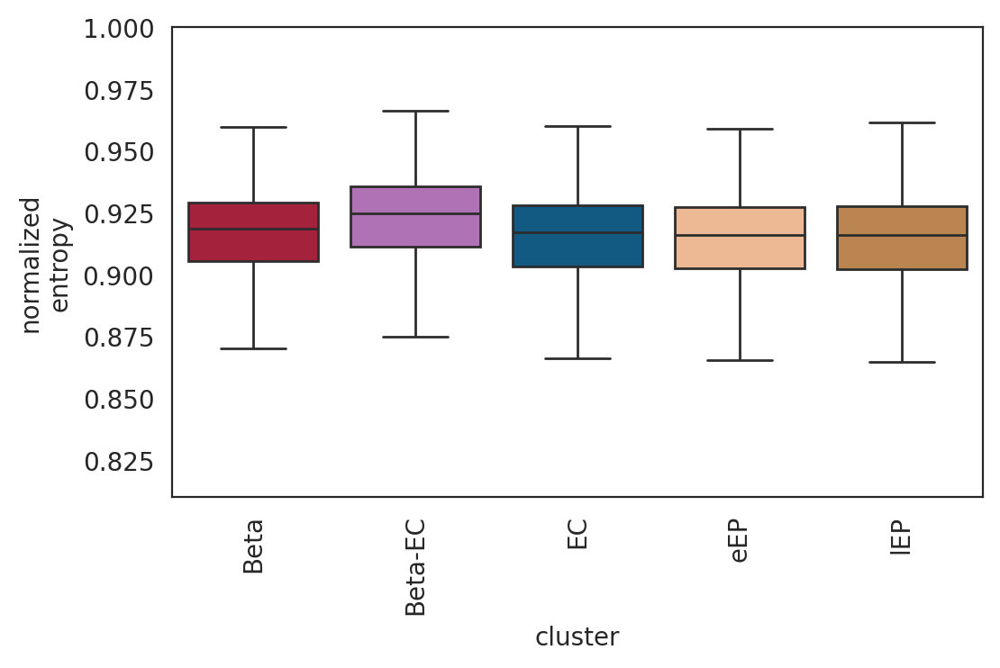

In [33]:
# Plot degree_centrality
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0,0.040])
links.plot_score_discributions(values=["degree_centrality_all"], 
                               method="boxplot", 
                               save=f"{save_folder}/centralityboxplot",
                              )
# Plot eigenvector_centrality
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0, 0.28])
links.plot_score_discributions(values=["eigenvector_centrality"],
                               method="boxplot",
                               save=f"{save_folder}/centralityboxplot")

#Plot entropy of the network
plt.subplots_adjust(left=0.15, bottom=0.3)
links.plot_network_entropy_distributions(save=f"{save_folder}/centralityboxplot")


PDX1


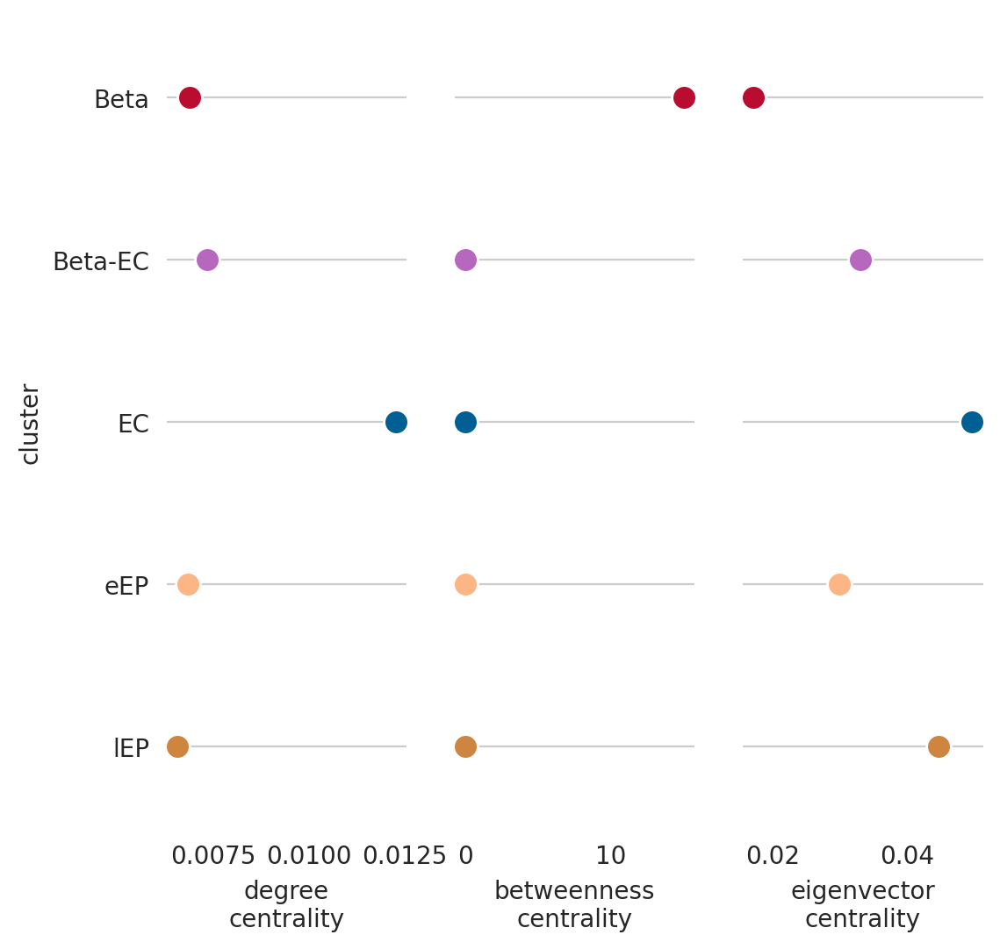

In [5]:
# Visualize HIVEP3 network score dynamics
links.plot_score_per_cluster(goi="PDX1", save=f"{save_folder}/network_score_per_gene/")


KLF12


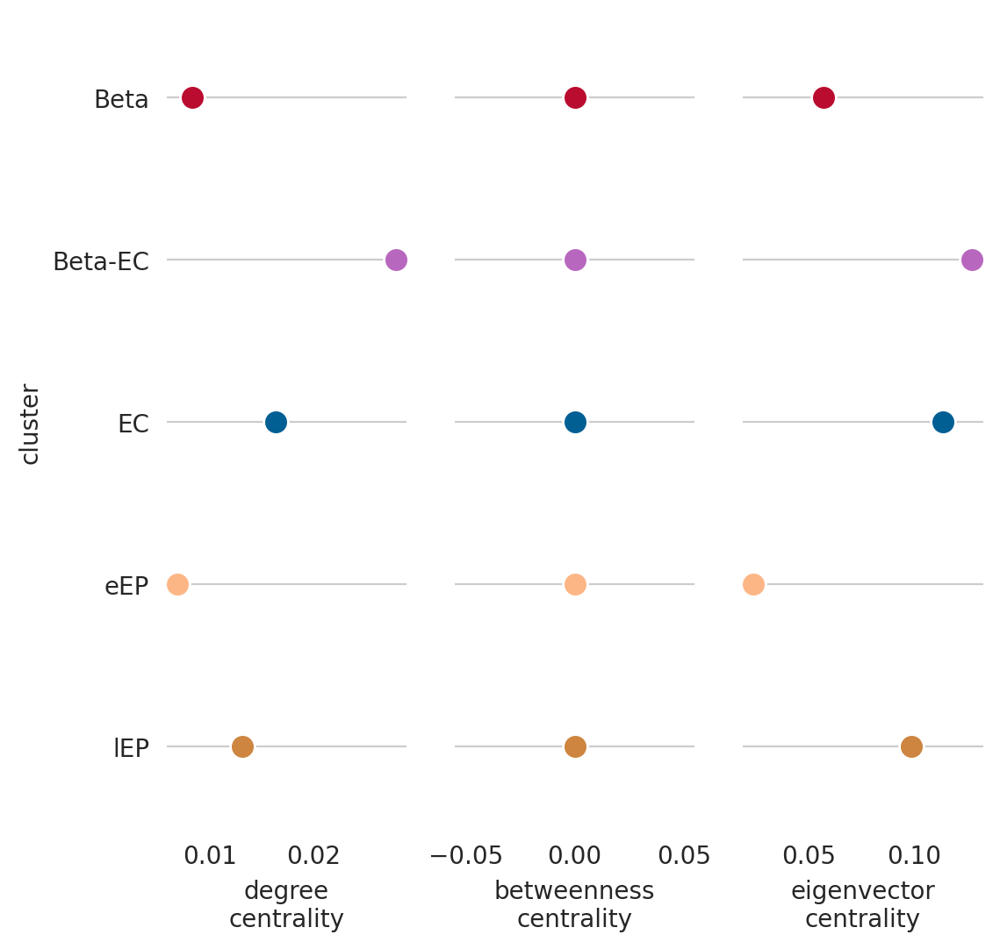

In [46]:
# Visualize HIVEP3 network score dynamics
links.plot_score_per_cluster(goi="KLF12", save=f"{save_folder}/network_score_per_gene/")


HNF4A


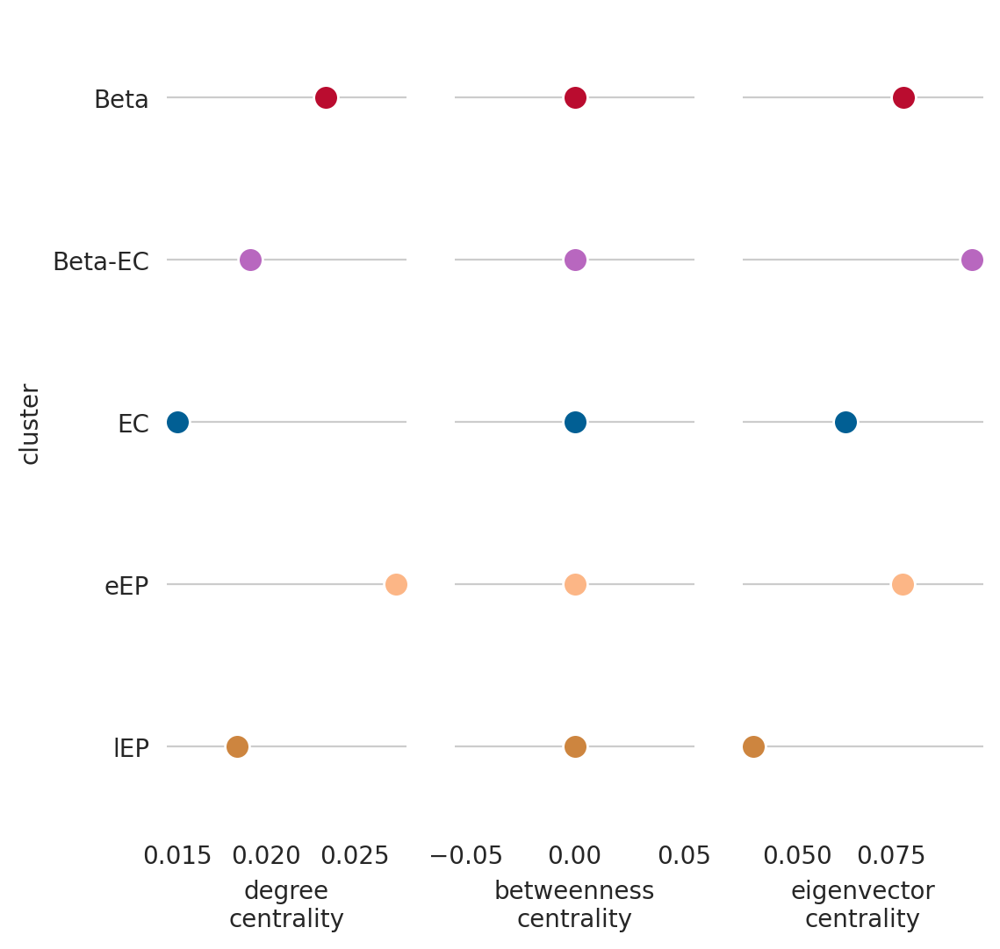

In [45]:
# Visualize HIVEP3 network score dynamics
links.plot_score_per_cluster(goi="HNF4A", save=f"{save_folder}/network_score_per_gene/")


LMX1A


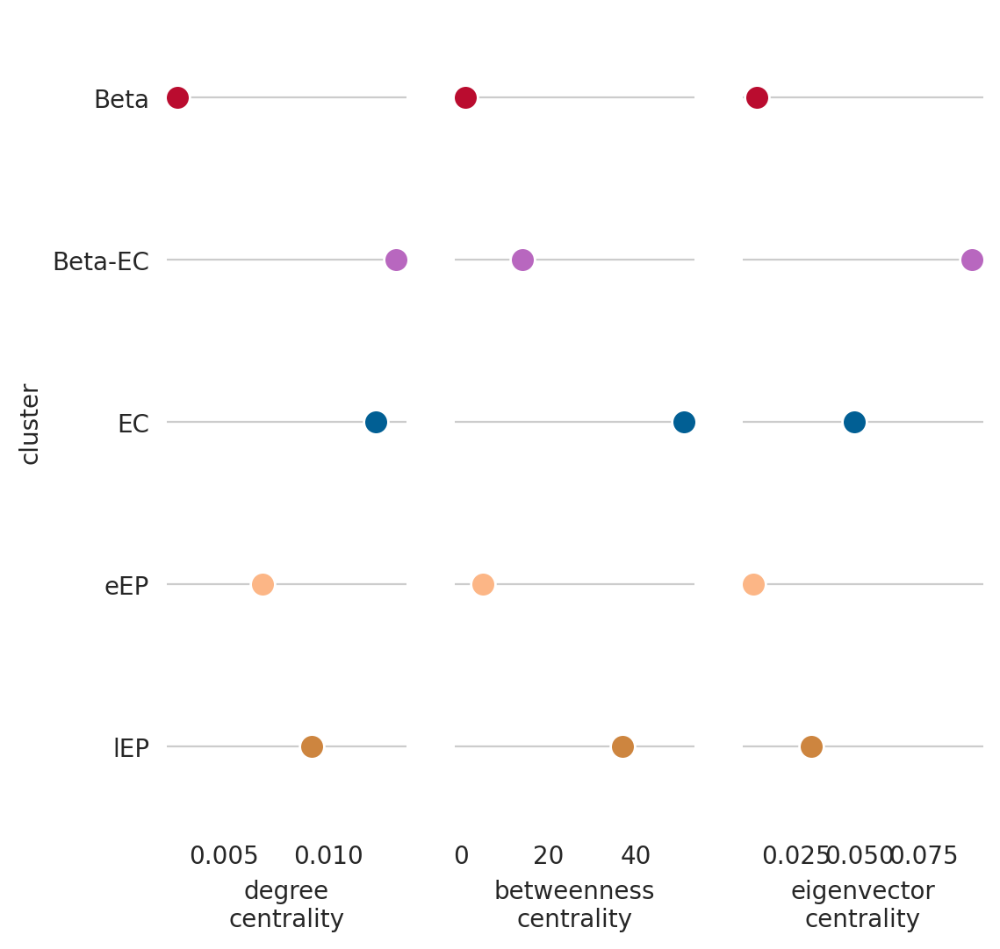

In [44]:
# Visualize HIVEP3 network score dynamics
links.plot_score_per_cluster(goi="LMX1A", save=f"{save_folder}/network_score_per_gene/")


PAX4


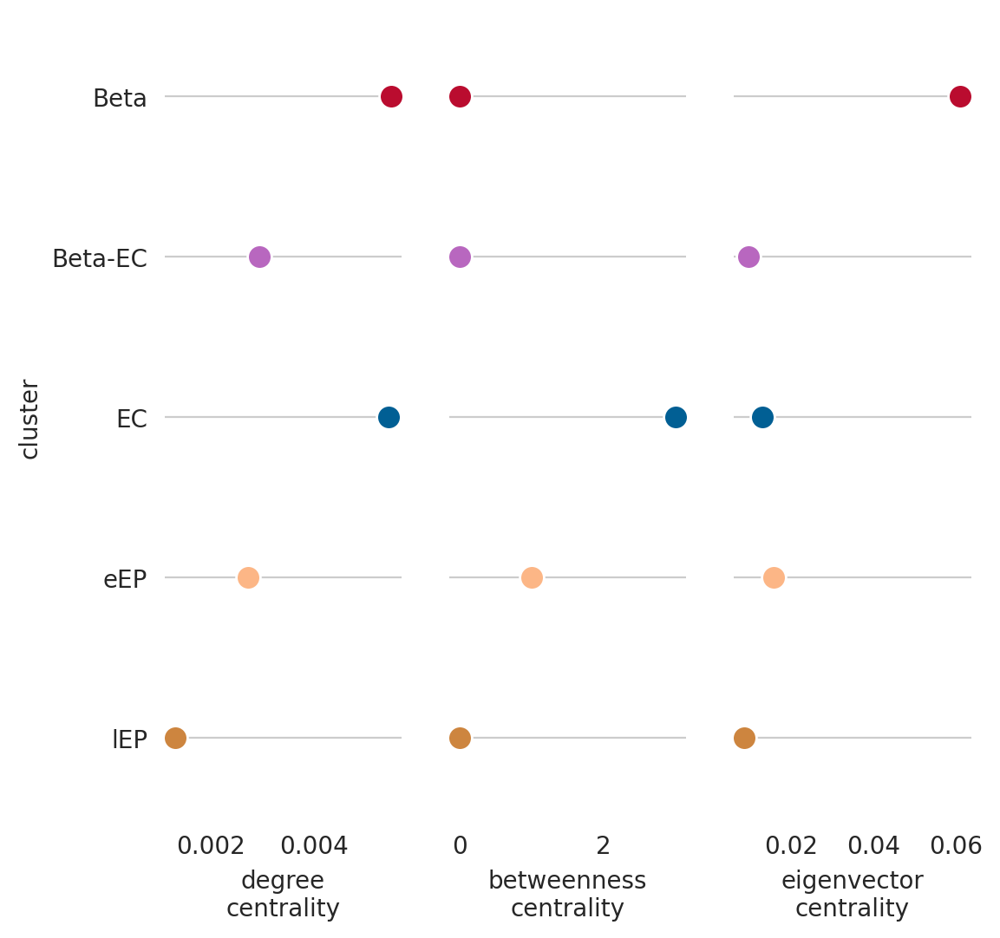

In [6]:
# Visualize HIVEP3 network score dynamics
links.plot_score_per_cluster(goi="PAX4", save=f"{save_folder}/network_score_per_gene/")


ZEB1


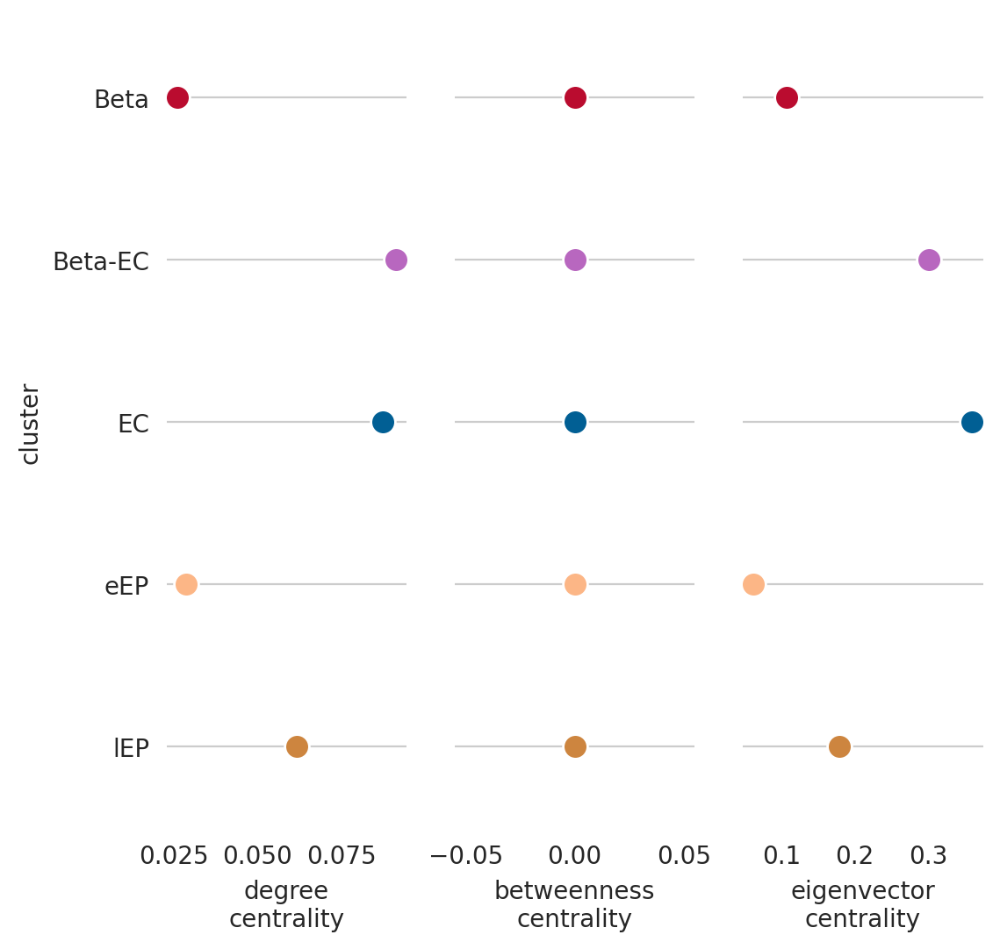

In [9]:
# Visualize HIVEP3 network score dynamics
links.plot_score_per_cluster(goi="ZEB1", save=f"{save_folder}/network_score_per_gene/")


## TFs Ranked coef

In [8]:
import os
import pandas as pd

# Combine all clusters into one table
all_targets_list = []

for cluster_name, cluster_df in links.filtered_links.items():
    temp = cluster_df.copy()
    temp["cell_state"] = cluster_name
    all_targets_list.append(temp)

all_targets_df = pd.concat(all_targets_list, ignore_index=True)

# Keep only the columns you want, if they exist
cols_to_keep = ["cell_state", "source", "target", "coef_mean", "coef_abs"]
cols_to_keep = [c for c in cols_to_keep if c in all_targets_df.columns]

all_targets_df = all_targets_df[cols_to_keep]

# Rename for clarity
all_targets_df = all_targets_df.rename(columns={
    "source": "TF",
    "target": "Target",
    "coef_mean": "Coefficient",
    "coef_abs": "Abs_Coefficient"
})

# Optional: sort nicely
all_targets_df = all_targets_df.sort_values(
    by=["cell_state", "TF", "Abs_Coefficient"],
    ascending=[True, True, False]
).reset_index(drop=True)

# Preview
print(all_targets_df.head())

# Save
output_dir = "outputs/celloracle_tables/DT_Subset_Beta_EC"
os.makedirs(output_dir, exist_ok=True)

all_targets_df.to_csv(
    os.path.join(output_dir, "All_TFs_all_targets_all_coefficients.csv"),
    index=False
)


  cell_state   TF   Target  Coefficient  Abs_Coefficient
0       Beta  AFP    SCN7A     0.328979         0.328979
1       Beta  AHR   MALAT1    -0.305608         0.305608
2       Beta  AHR  FAM155A     0.199251         0.199251
3       Beta  AHR   MAN1A1     0.179930         0.179930
4       Beta  AHR    SAMD5     0.169155         0.169155


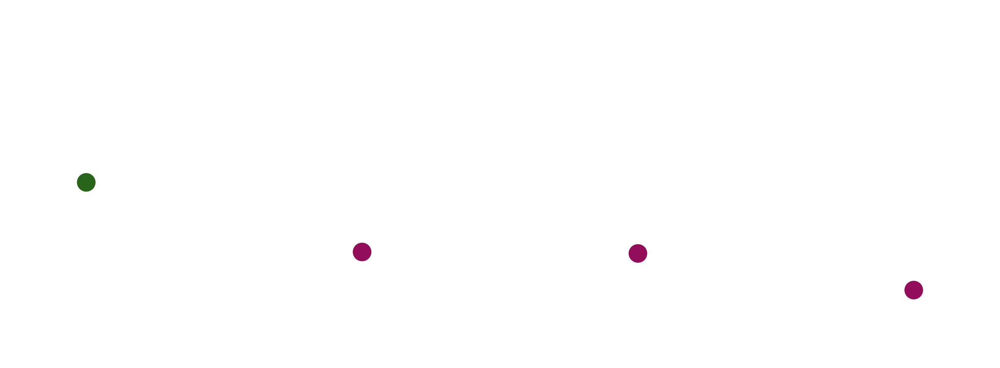

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/NEUROG3_targets_lEP_ranked_coefabs_test.png


['SCG2', 'AQP4-AS1', 'ACVR1C', 'SGO1-AS1']

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "lEP"
tf_name = "NEUROG3"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


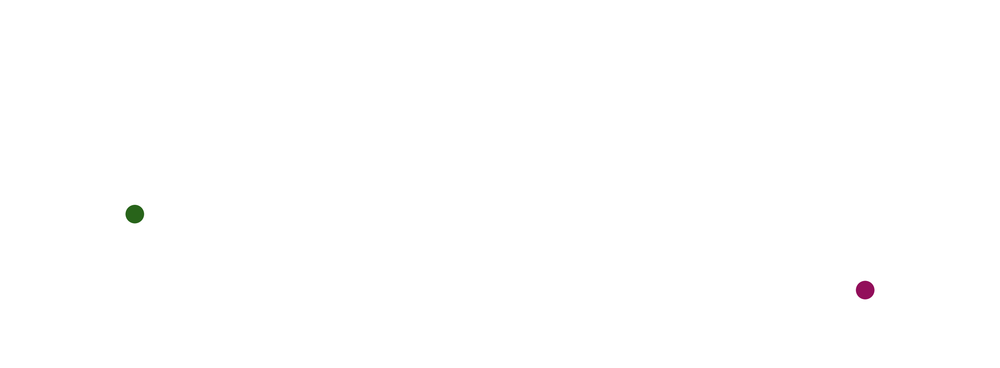

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/NEUROG3_targets_eEP_ranked_coefabs_test.png


['SCG2', 'ACVR1C']

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "eEP"
tf_name = "NEUROG3"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


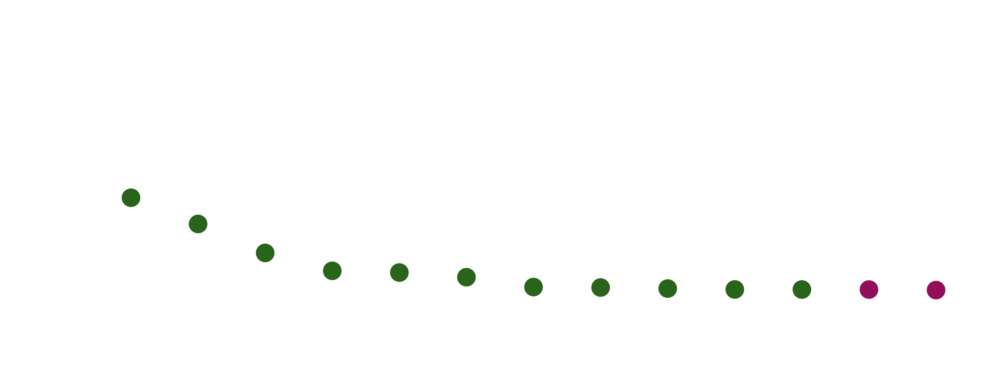

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/RFX6_targets_lEP_ranked_coefabs_test.png


['DCC',
 'MMP16',
 'ALCAM',
 'NPAS3',
 'NDST3',
 'GRIA4',
 'SPCS3',
 'TTC29',
 'DHRS7',
 'RALYL',
 'HECW2',
 'HIPK3',
 'NTM',
 'KCNMA1']

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "lEP"
tf_name = "RFX6"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


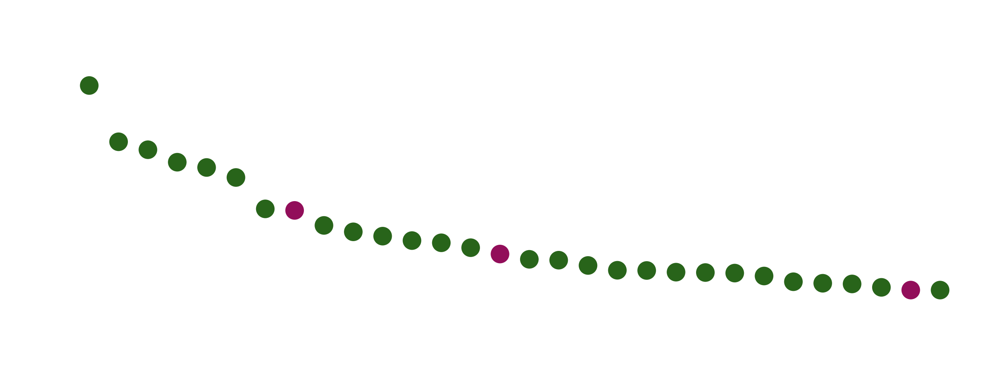

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/RFX6_targets_eEP_ranked_coefabs_test.png


['DCC',
 'MMP16',
 'NPAS3',
 'HECW2',
 'ALCAM',
 'KALRN',
 'SPCS3',
 'TRPM3',
 'SCGN',
 'RFX3',
 'HIPK3',
 'DCDC1',
 'AFDN',
 'CSMD3',
 'DHRS7',
 'KCNMA1',
 'FLRT2',
 'EDEM3',
 'OTULINL',
 'PDE1C',
 'PIBF1',
 'ST6GALNAC5',
 'FAM214A',
 'NDST3',
 'GPATCH2',
 'KCNT2',
 'FOXP2',
 'CRISPLD1',
 'TRMT9B',
 'CCSER1',
 'HEPACAM2']

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "eEP"
tf_name = "RFX6"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


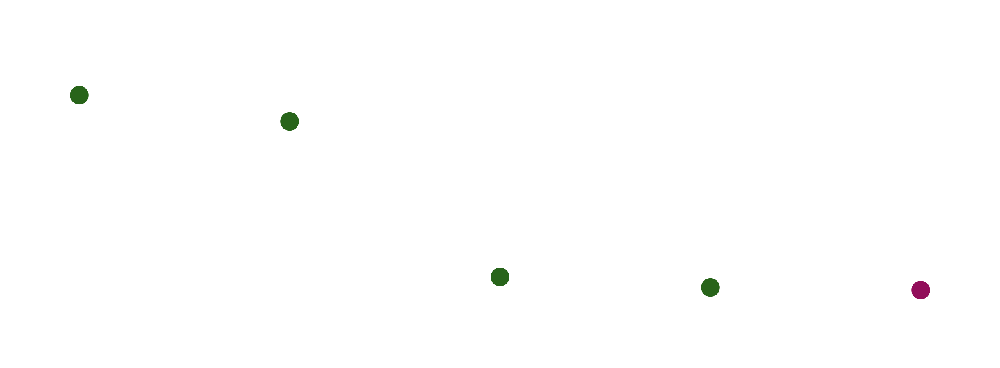

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/RFX6_targets_Beta_ranked_coefabs_test.png


['SCN7A', 'DCC', 'PPIB', 'GOLGA4', 'SCGN']

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "Beta"
tf_name = "RFX6"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


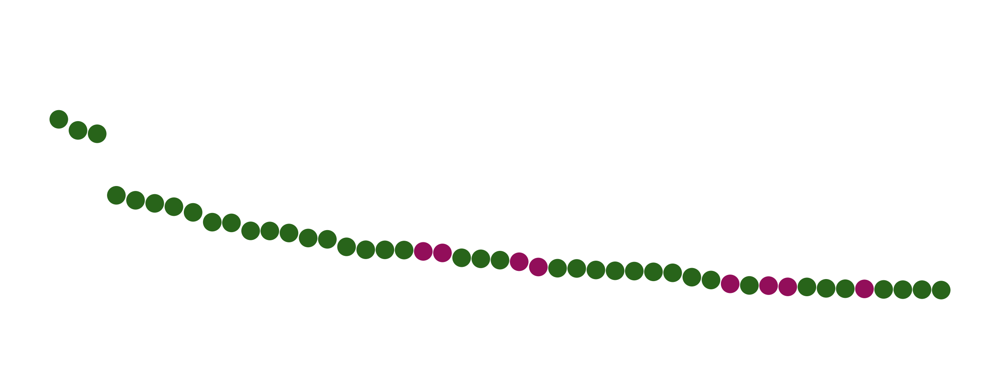

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_targets_lEP_ranked_coefabs_test.png


['KCNJ3',
 'RAB3C',
 'AOPEP',
 'MALAT1',
 'AFF3',
 'FTX',
 'IL1RAPL1',
 'ARHGAP18',
 'ARPP21',
 'ADAMTSL3',
 'GRIP1',
 'SPAG16',
 'LINC00907',
 'GCG',
 'CCNY',
 'FAM155A',
 'BRINP3',
 'LSAMP',
 'NEBL',
 'ALDH1A1',
 'RGS6',
 'SORCS2',
 'TSPAN5',
 'LMX1A',
 'PCDH7',
 'ERO1B',
 'ADAMTS9',
 'SEMA6D',
 'ALCAM',
 'PKIA',
 'DPYD',
 'ZMAT4',
 'STXBP5L',
 'VCAN',
 'GALNT13',
 'PDZD2',
 'PCNX2',
 'INS',
 'ST6GALNAC5',
 'N4BP2L2',
 'RGS7',
 'DANT2',
 'RPL18A',
 'GLIS3',
 'DACH2',
 'ASTN2',
 'PIP5K1B']

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "lEP"
tf_name = "ZEB1"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


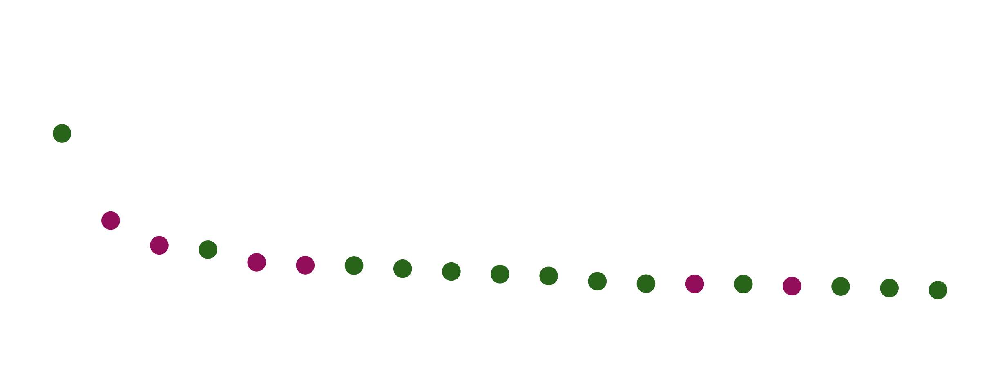

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_targets_Beta_ranked_coefabs_test.png


['MALAT1',
 'ALDH1A1',
 'INS',
 'AOPEP',
 'ERO1B',
 'PDZD2',
 'FTX',
 'RAB3C',
 'LINC00907',
 'DNAH14',
 'ARHGAP18',
 'AFF3',
 'PCNX2',
 'PCDH7',
 'FAM155A',
 'C7',
 'MIR217HG',
 'SPAG16',
 'ZMAT4']

In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "Beta"
tf_name = "ZEB1"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.7
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


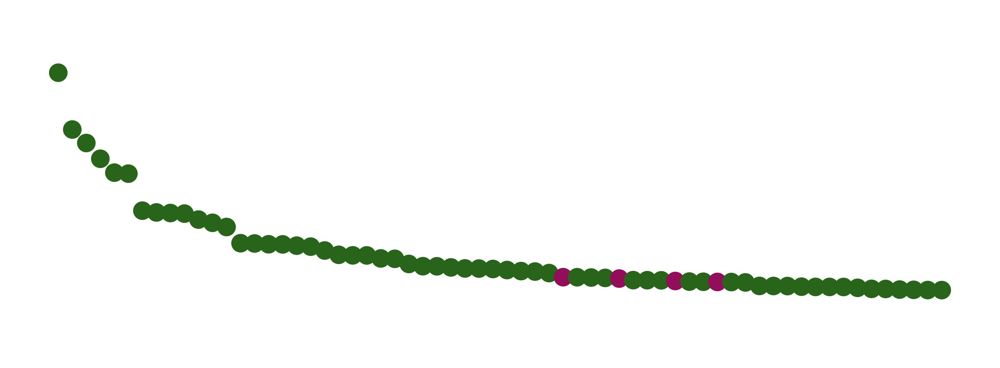

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_targets_EC_ranked_coefabs_test.png


['RAB3C',
 'KCNJ3',
 'AOPEP',
 'ARPP21',
 'GCG',
 'FTX',
 'DCC',
 'IL1RAPL1',
 'AFF3',
 'GRIP1',
 'ARHGAP18',
 'NEBL',
 'BRINP3',
 'TSPAN5',
 'LSAMP',
 'CCNY',
 'MALAT1',
 'SPAG16',
 'DANT2',
 'N4BP2L2',
 'GALNT13',
 'KCNJ6',
 'STXBP5L',
 'LINC00907',
 'ZMAT4',
 'PHF14',
 'CRISPLD1',
 'MACROD2',
 'PCNX2',
 'LMX1A',
 'VCAN',
 'VPS41',
 'RASSF6',
 'PKIA',
 'DPYD',
 'CDHR3',
 'RGS6',
 'NFKBIZ',
 'GLIS3',
 'FAM155A',
 'RPL18A',
 'PPP2R2B',
 'ALCAM',
 'DACH2',
 'PCDH7',
 'DCLK1',
 'KCNH7',
 'ERO1B',
 'SAMD12',
 'PTPRT',
 'CHGA',
 'SEMA6D',
 'KHDRBS2',
 'MGAT5',
 'SLC24A3',
 'ADAMTSL3',
 'CACNA1C',
 'ADAMTS9',
 'GAREM1',
 'RERG',
 'SORCS2',
 'TENM4',
 'TBC1D5',
 'AUTS2']

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

cluster_name = "EC"
tf_name = "ZEB1"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.0, 0.6
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.XX ----
ymax_fixed = 0.7
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)

# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 72.0)

# Add a tiny safety "air" (pixels)
air_px = 1.5

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.1 - xpad_data, xmax + 0.1 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs_test.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


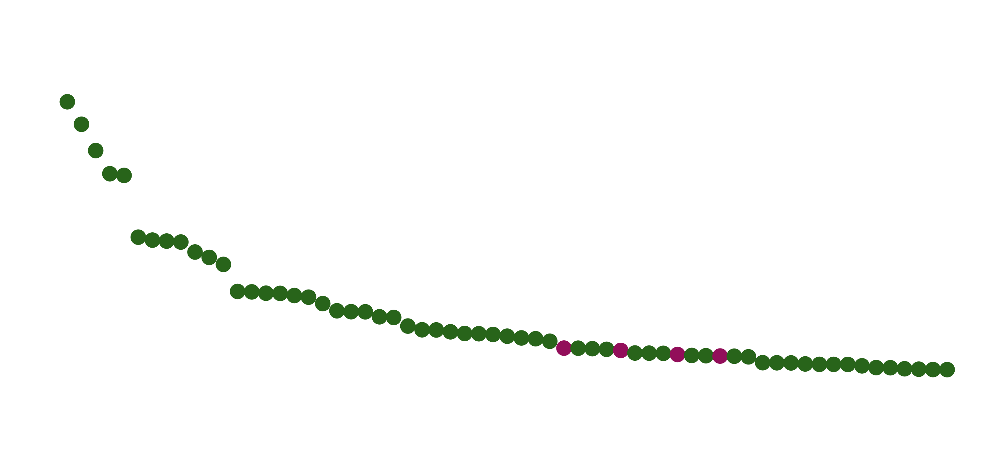

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_targets_EC_ranked_coefabs.png


['RAB3C',
 'KCNJ3',
 'AOPEP',
 'ARPP21',
 'GCG',
 'FTX',
 'DCC',
 'IL1RAPL1',
 'AFF3',
 'GRIP1',
 'ARHGAP18',
 'NEBL',
 'BRINP3',
 'TSPAN5',
 'LSAMP',
 'CCNY',
 'MALAT1',
 'SPAG16',
 'DANT2',
 'N4BP2L2',
 'GALNT13',
 'KCNJ6',
 'STXBP5L',
 'LINC00907',
 'ZMAT4',
 'PHF14',
 'CRISPLD1',
 'MACROD2',
 'PCNX2',
 'LMX1A',
 'VCAN',
 'VPS41',
 'RASSF6',
 'PKIA',
 'DPYD',
 'CDHR3',
 'RGS6',
 'NFKBIZ',
 'GLIS3',
 'FAM155A',
 'RPL18A',
 'PPP2R2B',
 'ALCAM',
 'DACH2',
 'PCDH7',
 'DCLK1',
 'KCNH7',
 'ERO1B',
 'SAMD12',
 'PTPRT',
 'CHGA',
 'SEMA6D',
 'KHDRBS2',
 'MGAT5',
 'SLC24A3',
 'ADAMTSL3',
 'CACNA1C',
 'ADAMTS9',
 'GAREM1',
 'RERG',
 'SORCS2',
 'TENM4',
 'TBC1D5',
 'AUTS2']

In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Define cluster and TF of interest
cluster_name = "EC"
tf_name = "ZEB1"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.44, 0.98
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.45 ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)
# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 36.0)

# Add a tiny safety "air" (pixels)
air_px = 1.8

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.0 - xpad_data, xmax + 0.0 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


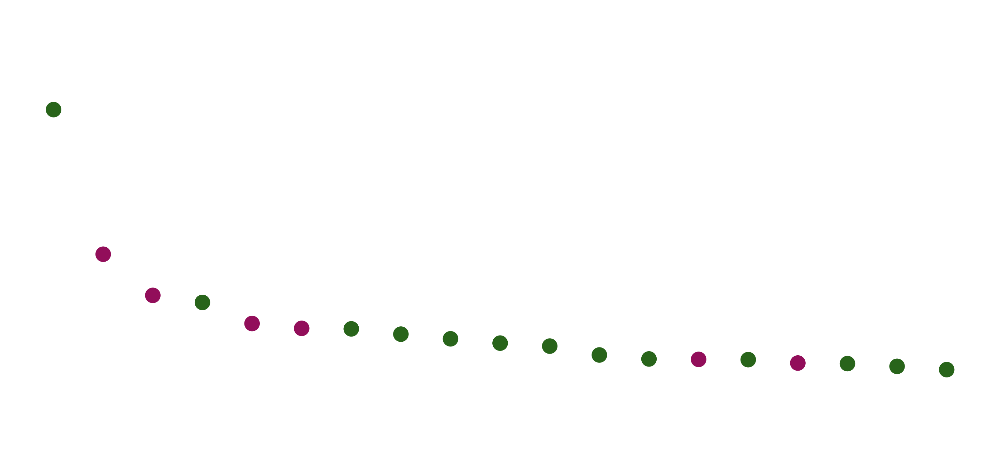

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_targets_Beta_ranked_coefabs.png


['MALAT1',
 'ALDH1A1',
 'INS',
 'AOPEP',
 'ERO1B',
 'PDZD2',
 'FTX',
 'RAB3C',
 'LINC00907',
 'DNAH14',
 'ARHGAP18',
 'AFF3',
 'PCNX2',
 'PCDH7',
 'FAM155A',
 'C7',
 'MIR217HG',
 'SPAG16',
 'ZMAT4']

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Define cluster and TF of interest
cluster_name = "Beta"
tf_name = "ZEB1"

filtered_links_df = links.filtered_links[cluster_name]
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

df = zeb1_targets.copy()
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

# --- FIXED CANVAS SIZE ---
fig_w, fig_h = 2.44, 0.98
dpi = 600
fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

dot_size = 3  # scatter 's' is area in points^2
ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=dot_size)

# ---- Y limits: fix top at 0.45 ----
ymax_fixed = 0.6
ymin = float(df["coef_abs"].min())

# keep a little padding at the bottom (same logic as before)
yrng = ymax_fixed - ymin
ypad = (0.12 * yrng) if yrng > 0 else 0.01

ax.set_ylim(ymin - ypad, ymax_fixed)
# ---- X padding: computed from marker radius so dots don't get cut ----
xmin, xmax = df["rank"].min(), df["rank"].max()

# Start with tight-ish xlim (0.5 gives half-step breathing room for integer ranks)
ax.set_xlim(xmin - 0.5, xmax + 0.5)

# Add small inner padding INSIDE the fixed canvas (keeps size exact)
pad = 0.04
fig.subplots_adjust(left=pad, right=1-pad, bottom=pad, top=1-pad)

# Force draw so we can measure axis width in pixels
fig.canvas.draw()
bbox = ax.get_window_extent()
ax_width_px = bbox.width

# Marker radius in points -> pixels
marker_radius_pt = np.sqrt(dot_size / np.pi)
marker_radius_px = marker_radius_pt * (dpi / 36.0)

# Add a tiny safety "air" (pixels)
air_px = 1.8

# Convert pixels -> data units for current x range
xrange = ax.get_xlim()[1] - ax.get_xlim()[0]
data_per_px = xrange / ax_width_px

# Minimal padding in data units to keep dot fully visible
xpad_data = (marker_radius_px + air_px) * data_per_px

# Apply final xlim with minimal safe padding
ax.set_xlim(xmin - 0.0 - xpad_data, xmax + 0.0 + xpad_data)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.margins(x=0, y=0)
ax.axis("off")

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs.png")

# IMPORTANT: no bbox_inches="tight" if you need exact final dimensions
fig.savefig(output_path, dpi=dpi, facecolor="white")
plt.show()

print(f"Figure saved to: {output_path}")
targets = df["target"].tolist()
targets


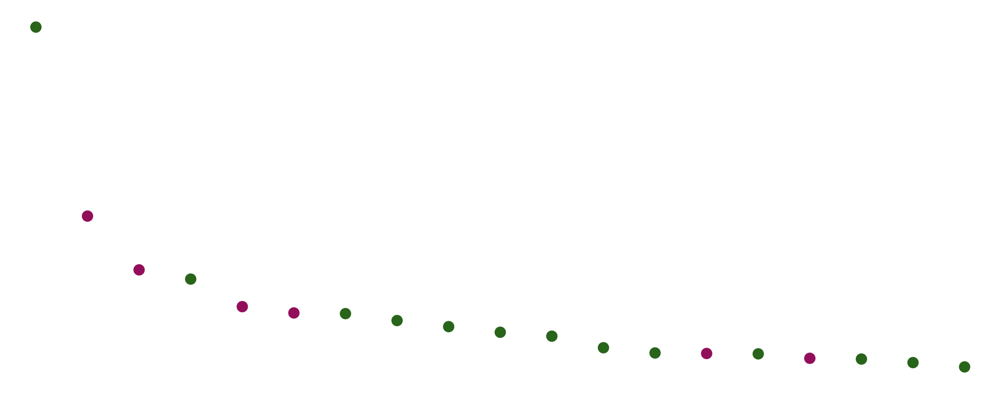

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_targets_Beta_ranked_coefabs.png


In [30]:
from matplotlib.ticker import MaxNLocator

# Define cluster and TF of interest
cluster_name = "Beta"
tf_name = "ZEB1"

# Get links for this cluster
filtered_links_df = links.filtered_links[cluster_name]

# To check a specific gene as source of target
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

# Start from your existing DF
df = zeb1_targets.copy()

# Rank by coef_abs (largest first)
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)

# Color: green if coef_mean > 0, magenta if < 0
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

fig, ax = plt.subplots(figsize=(10, 4))

ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=50)

# ---- Fix 1: axis limits exactly around your ranks ----
xmin = df["rank"].min()
xmax = df["rank"].max()
ax.set_xlim(xmin - 0.5, xmax + 0.5)   # or (0.5, len(df)+0.5)

# Force integer ticks
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

# Optional: no extra margin from autoscaling
ax.margins(x=0)

top_n = 0
x_offset = 0.2
y_offset = 0.005

for _, row in df.head(top_n).iterrows():
    ax.text(
        row["rank"] + x_offset,
        row["coef_abs"] + y_offset,
        row["target"],
        ha="left",
        va="center",
        fontsize=10,
        rotation=0
    )
    
ax.axis("off")

# ---- Fix 2: reduce whitespace around axes inside the figure ----
plt.tight_layout()          # compact layout
# Or, if you want it even tighter:
# fig.subplots_adjust(left=0.07, right=0.98, bottom=0.18, top=0.95)

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs.png")

plt.savefig(output_path, dpi=600, bbox_inches="tight")
plt.show()

print(f"Figure saved to: {output_path}")


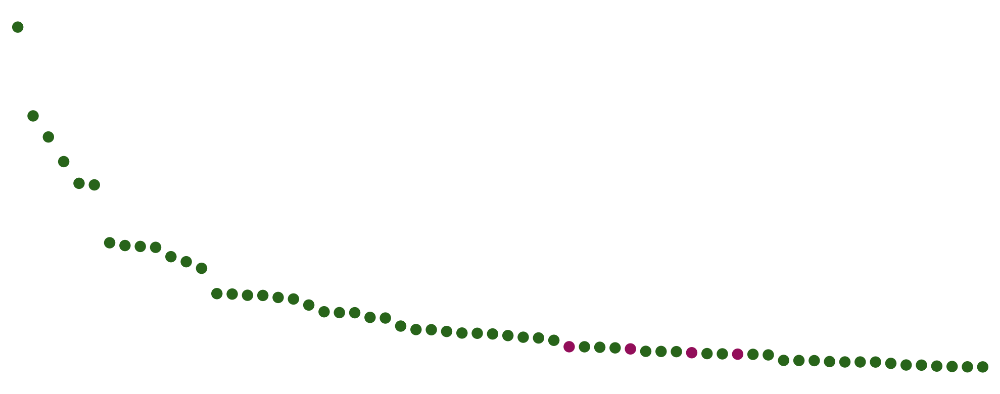

Figure saved to: outputs/celloracle_figures/DT_Subset_EC_Beta/ZEB1_targets_EC_ranked_coefabs.png


In [31]:
from matplotlib.ticker import MaxNLocator

# Define cluster and TF of interest
cluster_name = "EC"
tf_name = "ZEB1"

# Get links for this cluster
filtered_links_df = links.filtered_links[cluster_name]

# To check a specific gene as source of target
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

# Start from your existing DF
df = zeb1_targets.copy()

# Rank by coef_abs (largest first)
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)

# Color: green if coef_mean > 0, magenta if < 0
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

fig, ax = plt.subplots(figsize=(10, 4))

ax.scatter(df["rank"], df["coef_abs"], c=df["color"], s=50)

# ---- Fix 1: axis limits exactly around your ranks ----
xmin = df["rank"].min()
xmax = df["rank"].max()
ax.set_xlim(xmin - 0.5, xmax + 0.5)   # or (0.5, len(df)+0.5)

# Force integer ticks
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

# Optional: no extra margin from autoscaling
ax.margins(x=0)

top_n = 0
x_offset = 0.2
y_offset = 0.005

for _, row in df.head(top_n).iterrows():
    ax.text(
        row["rank"] + x_offset,
        row["coef_abs"] + y_offset,
        row["target"],
        ha="left",
        va="center",
        fontsize=10,
        rotation=0
    )
ax.axis("off")

# ---- Fix 2: reduce whitespace around axes inside the figure ----
plt.tight_layout()          # compact layout
# Or, if you want it even tighter:
# fig.subplots_adjust(left=0.07, right=0.98, bottom=0.18, top=0.95)

output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, f"{tf_name}_targets_{cluster_name}_ranked_coefabs.png")

plt.savefig(output_path, dpi=600, bbox_inches="tight")
plt.show()

print(f"Figure saved to: {output_path}")


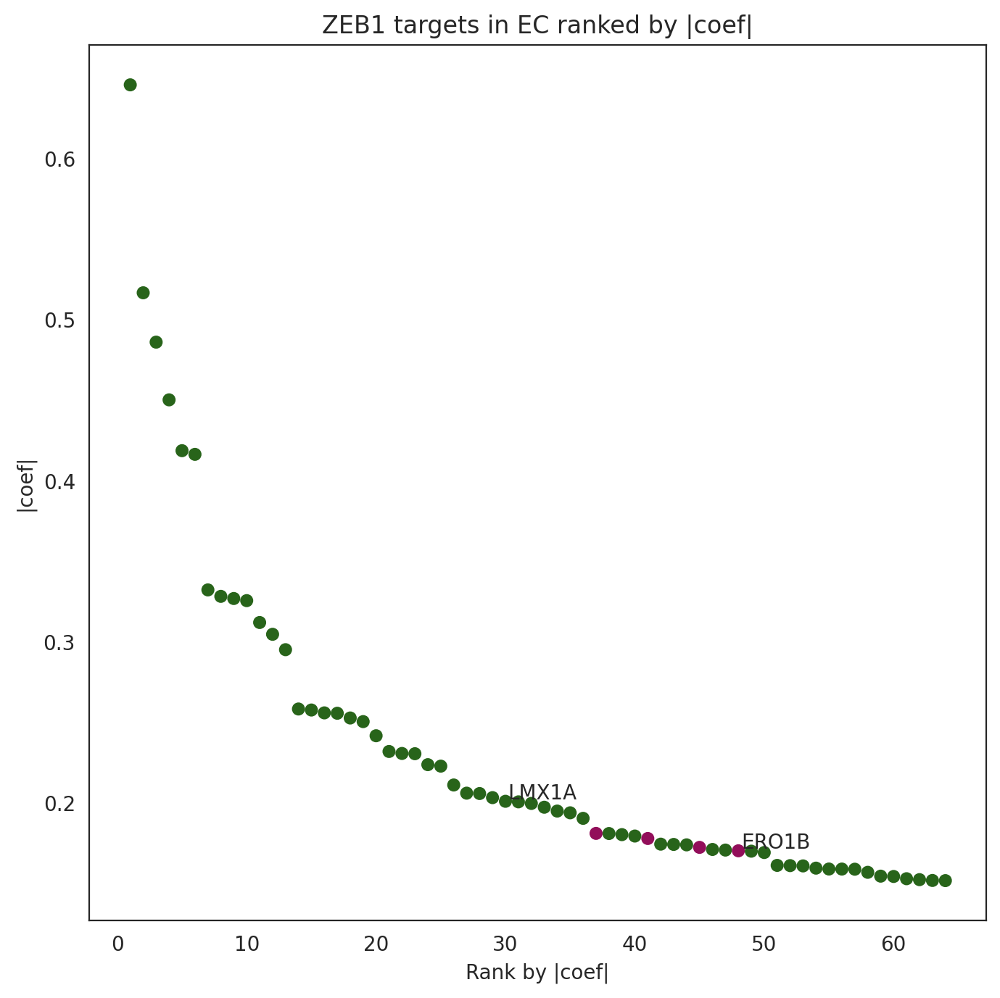

In [9]:
# Define cluster and TF of interest
cluster_name = "EC"
tf_name = "ZEB1"

# Get links for this cluster
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

# To check a specific gene as source of target
zeb1_targets = filtered_links_df[filtered_links_df.source == tf_name]

# Start from your existing DF
df = zeb1_targets.copy()

# Rank by coef_abs (largest first)
df = df.sort_values("coef_abs", ascending=False).reset_index(drop=True)
df["rank"] = np.arange(1, len(df) + 1)

# Color: blue if coef_mean > 0, red if < 0
df["color"] = np.where(df["coef_mean"] > 0, "#28641A", "#920E5A")

plt.figure(figsize=(7, 7))
plt.scatter(df["rank"], df["coef_abs"], c=df["color"], s=30)

# ---- Label specific genes ----
genes_to_label = ["LMX1A", "ERO1B"]  # use exact names as in df["target"]
x_offset = 0.2
y_offset = 0.005

label_df = df[df["target"].isin(genes_to_label)]
for _, row in label_df.iterrows():
    plt.text(
        row["rank"] + x_offset,        # x position (to the right of the dot)
        row["coef_abs"] + y_offset,    # y position (slightly above)
        row["target"],                 # the label text
        ha="left",
        va="center",
        fontsize=10,
        rotation=0
    )

plt.xlabel("Rank by |coef|")
plt.ylabel("|coef|")
plt.title(f"{tf_name} targets in {cluster_name} ranked by |coef|")
plt.tight_layout()

plt.show()


## Network plots

In [19]:
#Save tables

# Clusters you care about
clusters = ["eEP", "lEP", "Beta", "EC", "Beta-EC"]

# Output folder
output_dir = "outputs/celloracle_tables"
os.makedirs(output_dir, exist_ok=True)

for cluster_name in clusters:
    # Get links table for this cluster
    filtered_links_df = links.filtered_links[cluster_name]
    
    # Build file name (replace "-" just in case)
    safe_name = cluster_name.replace("-", "_")
    output_path = os.path.join(output_dir, f"CellOracle_links_{safe_name}.csv")
    
    # Save as CSV
    filtered_links_df.to_csv(output_path, index=False)
    print(f"Saved {cluster_name} to: {output_path}")


Saved eEP to: outputs/celloracle_tables/CellOracle_links_eEP.csv
Saved lEP to: outputs/celloracle_tables/CellOracle_links_lEP.csv
Saved Beta to: outputs/celloracle_tables/CellOracle_links_Beta.csv
Saved EC to: outputs/celloracle_tables/CellOracle_links_EC.csv
Saved Beta-EC to: outputs/celloracle_tables/CellOracle_links_Beta_EC.csv


In [48]:
#To check the filtered network edge as follows.

cluster_name = "Beta"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

#To check an specific gene as source of target
zeb1_targets = filtered_links_df[filtered_links_df.source == "ZEB1"]
ins_sources = filtered_links_df[filtered_links_df.target == "INS"]


print(zeb1_targets)
print(ins_sources)
#I can use this to look for candidates to analyze


       source     target  coef_mean  coef_abs             p      -logp
73113    ZEB1     MALAT1   0.503381  0.503381  1.629545e-15  14.787934
4325     ZEB1    ALDH1A1  -0.301011  0.301011  4.461185e-13  12.350550
60039    ZEB1        INS  -0.243437  0.243437  8.364213e-10   9.077575
6169     ZEB1      AOPEP   0.233551  0.233551  4.204422e-13  12.376294
40260    ZEB1      ERO1B  -0.204053  0.204053  3.264197e-09   8.486224
93281    ZEB1      PDZD2  -0.197301  0.197301  1.261310e-11  10.899178
47046    ZEB1        FTX   0.196568  0.196568  3.528719e-12  11.452383
103816   ZEB1      RAB3C   0.189159  0.189159  8.135965e-14  13.089591
68739    ZEB1  LINC00907   0.182640  0.182640  6.707087e-17  16.173466
33478    ZEB1     DNAH14   0.176614  0.176614  3.116177e-11  10.506378
7260     ZEB1   ARHGAP18   0.172425  0.172425  4.842946e-17  16.314890
3213     ZEB1       AFF3   0.160031  0.160031  8.647150e-09   8.063127
91554    ZEB1      PCNX2   0.154458  0.154458  8.986570e-12  11.046406
91227 

In [57]:
len(ins_sources)

16

In [48]:
list(zeb1_targets['target'])

['MALAT1',
 'ALDH1A1',
 'INS',
 'AOPEP',
 'ERO1B',
 'PDZD2',
 'FTX',
 'RAB3C',
 'LINC00907',
 'DNAH14',
 'ARHGAP18',
 'AFF3',
 'PCNX2',
 'PCDH7',
 'FAM155A',
 'C7',
 'MIR217HG',
 'SPAG16',
 'ZMAT4']

In [37]:
len(zeb1_targets)

19

In [46]:
list(zeb1_targets['target'])

['RAB3C',
 'KCNJ3',
 'AOPEP',
 'ARPP21',
 'GCG',
 'FTX',
 'DCC',
 'IL1RAPL1',
 'AFF3',
 'GRIP1',
 'ARHGAP18',
 'NEBL',
 'BRINP3',
 'TSPAN5',
 'LSAMP',
 'CCNY',
 'MALAT1',
 'SPAG16',
 'DANT2',
 'N4BP2L2',
 'GALNT13',
 'KCNJ6',
 'STXBP5L',
 'LINC00907',
 'ZMAT4',
 'PHF14',
 'CRISPLD1',
 'MACROD2',
 'PCNX2',
 'LMX1A',
 'VCAN',
 'VPS41',
 'RASSF6',
 'PKIA',
 'DPYD',
 'CDHR3',
 'RGS6',
 'NFKBIZ',
 'GLIS3',
 'FAM155A',
 'RPL18A',
 'PPP2R2B',
 'ALCAM',
 'DACH2',
 'PCDH7',
 'DCLK1',
 'KCNH7',
 'ERO1B',
 'SAMD12',
 'PTPRT',
 'CHGA',
 'SEMA6D',
 'KHDRBS2',
 'MGAT5',
 'SLC24A3',
 'ADAMTSL3',
 'CACNA1C',
 'ADAMTS9',
 'GAREM1',
 'RERG',
 'SORCS2',
 'TENM4',
 'TBC1D5',
 'AUTS2']

In [50]:
#To check the filtered network edge as follows.

cluster_name = "EC"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

#To check an specific gene as source of target
zeb1_targets = filtered_links_df[filtered_links_df.source == "ZEB1"]


len(zeb1_targets)
#I can use this to look for candidates to analyze


64

In [53]:
# See which clusters / groups you have
links.links_dict.keys()

# Pick one, e.g. EC or Beta
cluster = "EC"   # or whatever your EC cluster label is
linklist = links.links_dict[cluster].copy()
linklist.head()


,source,target,coef_mean,coef_abs,p,-logp
0,SRY,A1CF,0.018021,0.018021,1.245291e-04,3.904729
1,FOXJ3,A1CF,0.209882,0.209882,5.736070e-05,4.241386
2,ZBTB16,A1CF,-0.047297,0.047297,2.293019e-02,1.639592
3,CREB3L2,A1CF,-0.043348,0.043348,1.196020e-03,2.922261
4,FOXN3,A1CF,0.288019,0.288019,6.167857e-09,8.209866


In [54]:
tfs_of_interest = ["ZEB1", "TCF12", "HDAC2",'BCLAF1','NR3C1']

top5_targets = linklist[linklist["source"].isin(tfs_of_interest)]
top5_targets

,source,target,coef_mean,coef_abs,p,-logp
55,NR3C1,AAK1,0.078793,0.078793,4.603257e-09,8.336935
69,HDAC2,AAK1,-0.047841,0.047841,1.256406e-12,11.900870
71,BCLAF1,AAK1,0.009490,0.009490,1.842812e-02,1.734519
78,TCF12,AAK1,0.034580,0.034580,3.090198e-09,8.510014
79,ZEB1,AAK1,0.079808,0.079808,3.160076e-12,11.500302
...,...,...,...,...,...,...
148461,NR3C1,ZSWIM6,-0.011551,0.011551,7.319194e-02,1.135537
148478,HDAC2,ZSWIM6,0.003133,0.003133,1.894639e-01,0.722474
148484,BCLAF1,ZSWIM6,-0.005658,0.005658,8.867138e-03,2.052217
148488,TCF12,ZSWIM6,0.021824,0.021824,1.239019e-05,4.906922


In [55]:
linklist_filt = top5_targets.query("coef_abs > 0.25")
len(linklist_filt)

121

In [137]:
cols = ["source", "target", "coef_mean"]
linklist_filt[cols].to_csv("ZEB1_network_edges.tsv", sep="\t", index=False)


In [62]:
# Pick one, e.g. EC or Beta
cluster = "Beta"   # or whatever your EC cluster label is
linklist = links.links_dict[cluster].copy()

# -----------------------------------
# 1. Define TFs and filter linklist
# -----------------------------------
tfs_of_interest = ["ZEB1", "TCF12", "HDAC2", "BCLAF1", "FOXA2"]

# Keep only edges where the source is one of your TFs
top5_targets = linklist[linklist["source"].isin(tfs_of_interest)].copy()

# Apply your strength / significance thresholds
linklist_filt = top5_targets.query("coef_abs > 0.25").copy()
print("Number of edges after filtering:", len(linklist_filt))

# -----------------------------------
# 2. Add edge attributes for Cytoscape
# -----------------------------------

# Sign of regulation for edge color mapping
linklist_filt["regulation"] = np.where(
    linklist_filt["coef_mean"] > 0,
    "activation",
    "repression"
)

# Ensure we have an absolute coefficient column
if "coef_abs" not in linklist_filt.columns:
    linklist_filt["coef_abs"] = linklist_filt["coef_mean"].abs()

# Build edge table with useful columns
edge_cols = [c for c in ["source", "target", "coef_mean", "coef_abs", "p", "regulation"]
             if c in linklist_filt.columns]

edges_for_cyto = linklist_filt[edge_cols].copy()

# Save edges file for Cytoscape
edges_for_cyto.to_csv(
    f"checkpoints/Beta_EC_Subset_DT_{cluster}_TF_Links_network_edges.tsv",
    sep="\t",
    index=False
)
print(f"Saved edges to Beta_EC_Subset_DT_{cluster}_TF_Links_network_edges.tsv")

# -----------------------------------
# 3. Build node table (TF vs target)
# -----------------------------------

# All genes appearing in this subnetwork
all_genes = pd.unique(edges_for_cyto[["source", "target"]].values.ravel())

nodes_for_cyto = pd.DataFrame({"name": all_genes})

# Tag TFs vs targets
nodes_for_cyto["node_type"] = np.where(
    nodes_for_cyto["name"].isin(tfs_of_interest),
    "TF",
    "target"
)

# Save nodes file for Cytoscape
nodes_for_cyto.to_csv(
    f"checkpoints/Beta_EC_Subset_DT_{cluster}_TF_Links_network_nodes.tsv",
    sep="\t",
    index=False
)
print(f"Saved nodes to Beta_EC_Subset_DT_{cluster}_TF_Links_network_nodes.tsv")


Number of edges after filtering: 109
Saved edges to Beta_EC_Subset_DT_Beta_TF_Links_network_edges.tsv
Saved nodes to Beta_EC_Subset_DT_Beta_TF_Links_network_nodes.tsv


In [64]:
# Pick one, e.g. EC or Beta
cluster = "EC"   # or whatever your EC cluster label is
linklist = links.links_dict[cluster].copy()

# -----------------------------------
# 1. Define TFs and filter linklist
# -----------------------------------
tfs_of_interest = ["ZEB1", "TCF12", "HDAC2", "BCLAF1", "NR3C1"]

# Keep only edges where the source is one of your TFs
top5_targets = linklist[linklist["source"].isin(tfs_of_interest)].copy()

# Apply your strength / significance thresholds
linklist_filt = top5_targets.query("coef_abs > 0.25").copy()
print("Number of edges after filtering:", len(linklist_filt))

# -----------------------------------
# 2. Add edge attributes for Cytoscape
# -----------------------------------

# Sign of regulation for edge color mapping
linklist_filt["regulation"] = np.where(
    linklist_filt["coef_mean"] > 0,
    "activation",
    "repression"
)

# Ensure we have an absolute coefficient column
if "coef_abs" not in linklist_filt.columns:
    linklist_filt["coef_abs"] = linklist_filt["coef_mean"].abs()

# Build edge table with useful columns
edge_cols = [c for c in ["source", "target", "coef_mean", "coef_abs", "p", "regulation"]
             if c in linklist_filt.columns]

edges_for_cyto = linklist_filt[edge_cols].copy()

# Save edges file for Cytoscape
edges_for_cyto.to_csv(
    f"checkpoints/Beta_EC_Subset_DT_{cluster}_TF_Links_network_edges.tsv",
    sep="\t",
    index=False
)
print(f"Saved edges to Beta_EC_Subset_DT_{cluster}_TF_Links_network_edges.tsv")

# -----------------------------------
# 3. Build node table (TF vs target)
# -----------------------------------

# All genes appearing in this subnetwork
all_genes = pd.unique(edges_for_cyto[["source", "target"]].values.ravel())

nodes_for_cyto = pd.DataFrame({"name": all_genes})

# Tag TFs vs targets
nodes_for_cyto["node_type"] = np.where(
    nodes_for_cyto["name"].isin(tfs_of_interest),
    "TF",
    "target"
)

# Save nodes file for Cytoscape
nodes_for_cyto.to_csv(
    f"checkpoints/Beta_EC_Subset_DT_{cluster}_TF_Links_network_nodes.tsv",
    sep="\t",
    index=False
)
print(f"Saved nodes to Beta_EC_Subset_DT_{cluster}_TF_Links_network_nodes.tsv")


Number of edges after filtering: 127
Saved edges to Beta_EC_Subset_DT_EC_TF_Links_network_edges.tsv
Saved nodes to Beta_EC_Subset_DT_EC_TF_Links_network_nodes.tsv


In [32]:
import networkx as nx
G = nx.Graph()

In [36]:
# Tiene una sonrisa que la risa se te infecta, y sabe lo que vale, a ella se la respeta. - La Beba by Temple Sour